# Trigger Selection Analysis - Djibouti 2024

Author - Nitin Magima

Date - March 2024

Version - 1.0

## Introduction and Objectives

### Purpose
The Jupyter Notebook aims to support the trigger selection analysis in Djibouti during the relevant seasons such as March-April-May (MAM), July-August-September (JAS), and October-November-December (OND).

### Audience
Tailored for government officials in agriculture, water resources, and disaster management sectors.

### Objectives
To provide an in-depth analysis of trigger selection during MAM, JAS, and OND using the Design Tool API.

### Summary

The Jupyter Notebooks produces heatmaps and box plots for the respective seasons. For each season, it focuses on the high severity and moderate severity trigger levels and further divides for each severity at the national and regional levels. 

For each severity level during the stakeholder workshop, bad years highlighting years affected by drought were collected. Using these bad years and a range of frequencies ideally from 5 to 50, the Design Tool API pulls from the design tool and produces a table, with the data set description seen below. 

The data is then filtered only for the years that have been triggered and a heatmap is produced. Looking at the heatmap, the user can decide what would be appropriate triggers for high severity at the national level, and similarly for the regional level for each season.  

After that, if the user wants to decide what kind of threshold protocol should be used above which the forecast should be still triggered, the trigger difference has been shown here as a box plot and also as quantile data.


Decision Maptools
1. [OND season](https://iridl.ldeo.columbia.edu/fbfmaproom2/djibouti-ond)
1. [JAS season](https://iridl.ldeo.columbia.edu/fbfmaproom2/djibouti)
1. [MAM season](https://iridl.ldeo.columbia.edu/fbfmaproom2/djibouti-mam)

IMPORTANT - DISCLAIMER AND RIGHTS STATEMENT
This is a set of scripts written by the Financial Instruments Team at the International Research Institute for Climate and Society (IRI) part of The Columbia Climate School, Columbia University They are shared for educational purposes only.  Anyone who uses this code or its functionality or structure assumes full liability and should inform and credit IRI.

### Dataset Description

1. Admin Name: The name of the administrative region.
1. Year: Bad Years collected during the stakeholder workshop.
1. Frequency (%): The frequency percentage, indicates the likelihood of a certain event happening.
1. Issue Month: The month when the forecast was issued.
1. Forecast: The forecasted value.
1. Forecast Threshold: The threshold value above or below which a forecasted event is considered significant.
1. Trigger Difference: The difference between the forecast and the threshold.
1. Forecast Accuracy (%): The accuracy percentage of the forecast.
1. Triggered: Indicates whether the forecasted event met the criteria to be considered significant.
1. Adjusted Forecast Threshold: An adjusted threshold value for the forecast.
1. Threshold Protocol: A numeric representation of the protocol used for setting thresholds.
1. Triggered Adjusted: Indicates whether the forecasted event met the criteria to be considered significant based on the adjusted threshold.
1. Act in Vain: The number of actions taken that were unnecessary.
1. Fail to Act: The number of times a necessary action was not taken.
1. Worthy Action: The number of actions taken that were justified.
1. Worthy Inaction: The number of times inaction was the correct decision.
1. Design Tool URL: A URL to a design tool related to the forecast.

In [1]:
# Loading Packages

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import utils as u

# JAS Season

In [2]:
# Loading Country Variables

maproom = "djibouti"

config = u.load_config()

# Accessing values for the specified maproom

country_config = config.get("maprooms", {}).get(maproom, {})

# Access individual values using the 'maproom' variable

country = country_config.get("country")
modes = country_config.get("mode", [])
year = country_config.get("year")
season = country_config.get("season")
target_season = country_config.get("target_season")
issue_month = country_config['issue_month']
predictor = country_config['predictor']
predictand = country_config['predictand']
include_upcoming = country_config['include_upcoming']
design_tool = country_config['design_tool']
report = country_config['report']
username = country_config['username']
password = country_config['password']
threshold_protocol = country_config['threshold_protocol']
need_valid_keys = country_config['need_valid_keys']
valid_keys = country_config['admin1_list']

## High Severity

In [3]:
# Bad Years collected during the stakeholder workshop

bad_years = [1982, 1983, 1984, 1985, 1986, 1987, 1989, 1991, 1993, 2004, 2009, 2012, 2021]

# Range of Frequencies

frequencies = list(range(5, 51, 5))

### National Level

#### Trigger Table

In [4]:
# Display Trigger Table at the National Level based on the Bad Years and Frequency

admin_tables = u.get_trigger_tables(maproom=maproom, mode=0, season=season, predictor=predictor, bad_years = bad_years,
                                              predictand=predictand, year = year, issue_month=issue_month, frequencies=frequencies,
                                              include_upcoming=include_upcoming, threshold_protocol=threshold_protocol,
                                              username=username, password=password,need_valid_keys=need_valid_keys,
                                              valid_keys=valid_keys)

combined_admin0 = pd.concat(admin_tables["admin0_tables"].values(), ignore_index=True)

u.style_and_render_df_with_hyperlinks(combined_admin0)

Fetching....


,Admin Name,Year,Frequency (%),Issue Month,Forecast,Forecast Threshold,Trigger Difference,Forecast Accuracy (%),Triggered,Adjusted Forecast Threshold,Threshold Protocol,Triggered Adjusted,Act in Vain,Fail to Act,Worthy Action,Worthy Inaction,Design Tool URL
0,Djibouti,2021,5%,Jun,nan,32.88,nan,80.00%,False,32.88,0,False,1.0,5.0,0.0,24.0,Design Tool Link
1,Djibouti,2012,5%,Jun,13.59,32.88,-19.29,80.00%,False,32.88,0,False,1.0,5.0,0.0,24.0,Design Tool Link
2,Djibouti,2009,5%,Jun,22.65,32.88,-10.23,80.00%,False,32.88,0,False,1.0,5.0,0.0,24.0,Design Tool Link
3,Djibouti,2004,5%,Jun,14.72,32.88,-18.16,80.00%,False,32.88,0,False,1.0,5.0,0.0,24.0,Design Tool Link
4,Djibouti,1993,5%,Jun,11.64,32.88,-21.25,80.00%,False,32.88,0,False,1.0,5.0,0.0,24.0,Design Tool Link
5,Djibouti,1991,5%,Jun,16.61,32.88,-16.27,80.00%,False,32.88,0,False,1.0,5.0,0.0,24.0,Design Tool Link
6,Djibouti,2021,5%,May,nan,22.92,nan,80.00%,False,22.92,0,False,1.0,5.0,0.0,24.0,Design Tool Link
7,Djibouti,2012,5%,May,13.37,22.92,-9.55,80.00%,False,22.92,0,False,1.0,5.0,0.0,24.0,Design Tool Link
8,Djibouti,2009,5%,May,14.69,22.92,-8.23,80.00%,False,22.92,0,False,1.0,5.0,0.0,24.0,Design Tool Link
9,Djibouti,2004,5%,May,12.08,22.92,-10.84,80.00%,False,22.92,0,False,1.0,5.0,0.0,24.0,Design Tool Link


In [5]:
# Filter for non - triggered events
non_triggered_events = combined_admin0[~combined_admin0['Triggered']]['Year'].unique()
print(non_triggered_events)

[2021 2012 2009 2004 1993 1991]


#### Triggered Bad Years by Frequency and Issue Month

In [6]:
# Filter the data for triggered bad years and then summarize the counts by frequency and issue month.

# Filter for triggered bad years
triggered_events = combined_admin0[combined_admin0['Triggered']]

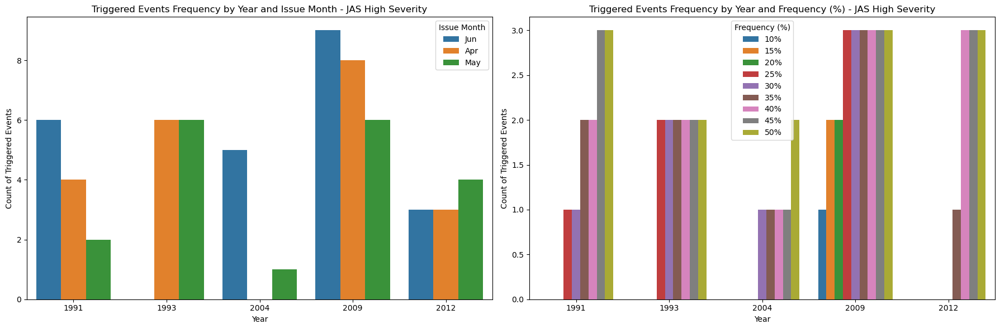

In [7]:
u.plot_triggered_events_admin0(triggered_events, season = 'JAS', severity = 'High Severity')

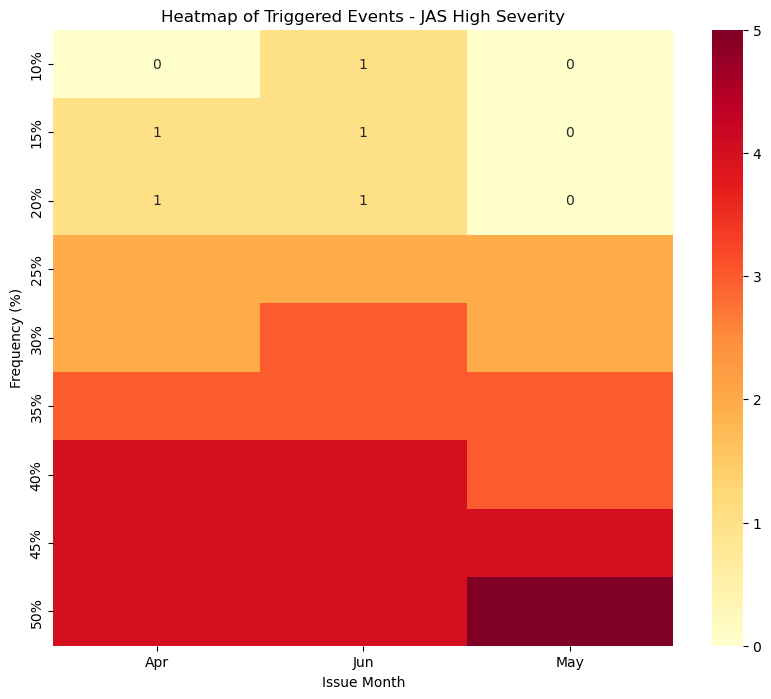

<Figure size 640x480 with 0 Axes>

In [8]:
u.plot_triggered_events_heatmap_admin0(triggered_events, season = 'JAS', severity = 'High Severity')

#### Threshold Protocol Analysis Using Trigger Differences

Quantile Ranges for Trigger Difference - JAS High Severity {0.0: -21.247094398519643, 0.25: -4.3167217394065185, 0.5: -0.18317750181401316, 0.75: 2.7940897920485934, 1.0: 13.010689046669874}
{0.0: -21.247094398519643, 0.25: -4.3167217394065185, 0.5: -0.18317750181401316, 0.75: 2.7940897920485934, 1.0: 13.010689046669874}




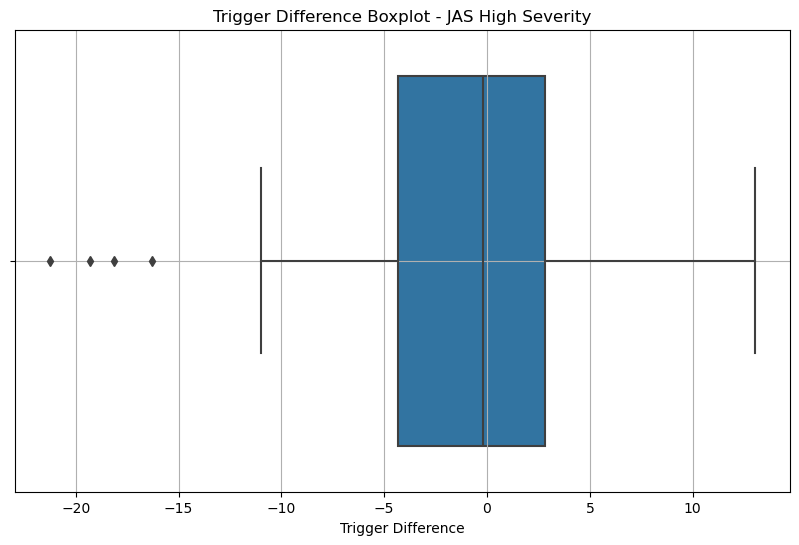

In [9]:
u.plot_trigger_difference_boxplot_admin0(combined_admin0, season = 'JAS', severity = 'High Severity')

### Regional Level

#### Trigger Table

In [10]:
# Display Trigger Table at the National Level based on the Bad Years and Frequency

admin_tables = u.get_trigger_tables(maproom=maproom, mode=1, season=season, predictor=predictor, bad_years = bad_years,
                                              predictand=predictand, year = year, issue_month=issue_month, frequencies=frequencies,
                                              include_upcoming=include_upcoming, threshold_protocol=threshold_protocol,
                                              username=username, password=password,need_valid_keys=need_valid_keys,
                                              valid_keys=valid_keys)

combined_admin1 = pd.concat(admin_tables["admin1_tables"].values(), ignore_index=True)

u.style_and_render_df_with_hyperlinks(combined_admin1)

Fetching....


,Admin Name,Year,Frequency (%),Issue Month,Forecast,Forecast Threshold,Trigger Difference,Forecast Accuracy (%),Triggered,Adjusted Forecast Threshold,Threshold Protocol,Triggered Adjusted,Act in Vain,Fail to Act,Worthy Action,Worthy Inaction,Design Tool URL
0,Djibouti,2021,5%,Jun,nan,35.24,nan,80.00%,False,35.24,0,False,1.0,5.0,0.0,24.0,Design Tool Link
1,Djibouti,2012,5%,Jun,14.73,35.24,-20.51,80.00%,False,35.24,0,False,1.0,5.0,0.0,24.0,Design Tool Link
2,Djibouti,2009,5%,Jun,23.11,35.24,-12.13,80.00%,False,35.24,0,False,1.0,5.0,0.0,24.0,Design Tool Link
3,Djibouti,2004,5%,Jun,17.63,35.24,-17.60,80.00%,False,35.24,0,False,1.0,5.0,0.0,24.0,Design Tool Link
4,Djibouti,1993,5%,Jun,13.70,35.24,-21.54,80.00%,False,35.24,0,False,1.0,5.0,0.0,24.0,Design Tool Link
5,Djibouti,1991,5%,Jun,17.32,35.24,-17.92,80.00%,False,35.24,0,False,1.0,5.0,0.0,24.0,Design Tool Link
6,Ali Sabieh,2021,5%,Jun,nan,39.23,nan,80.00%,False,39.23,0,False,1.0,5.0,0.0,24.0,Design Tool Link
7,Ali Sabieh,2012,5%,Jun,14.80,39.23,-24.43,80.00%,False,39.23,0,False,1.0,5.0,0.0,24.0,Design Tool Link
8,Ali Sabieh,2009,5%,Jun,24.44,39.23,-14.79,80.00%,False,39.23,0,False,1.0,5.0,0.0,24.0,Design Tool Link
9,Ali Sabieh,2004,5%,Jun,15.19,39.23,-24.04,80.00%,False,39.23,0,False,1.0,5.0,0.0,24.0,Design Tool Link


In [11]:
# Filter for non - triggered events
non_triggered_events = combined_admin1[~combined_admin1['Triggered']]['Year'].unique()
print(non_triggered_events)

[2021 2012 2009 2004 1993 1991]


#### Triggered Bad Years by Frequency and Issue Month

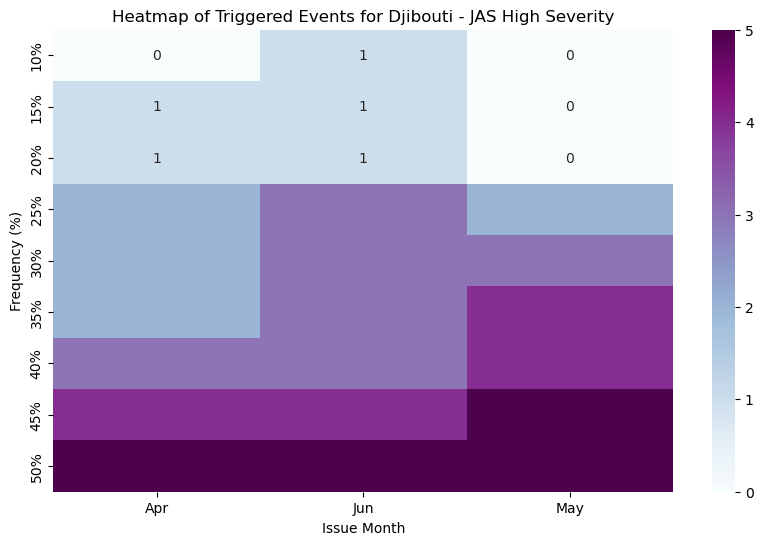

<Figure size 640x480 with 0 Axes>

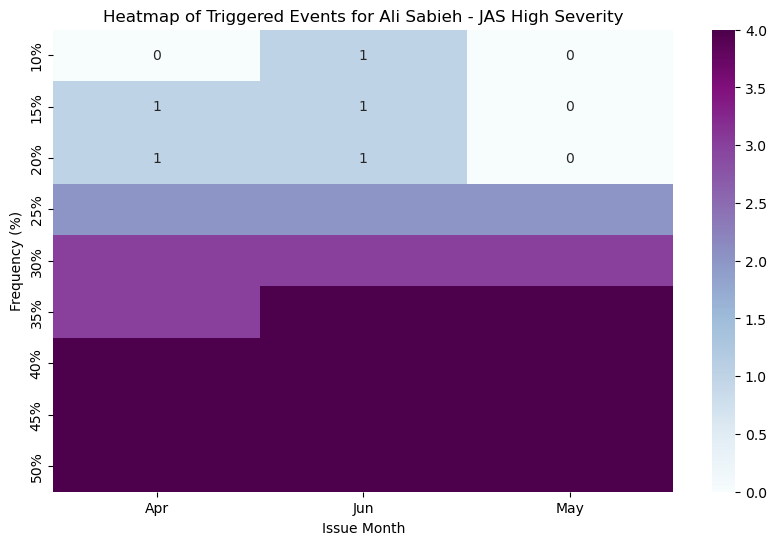

<Figure size 640x480 with 0 Axes>

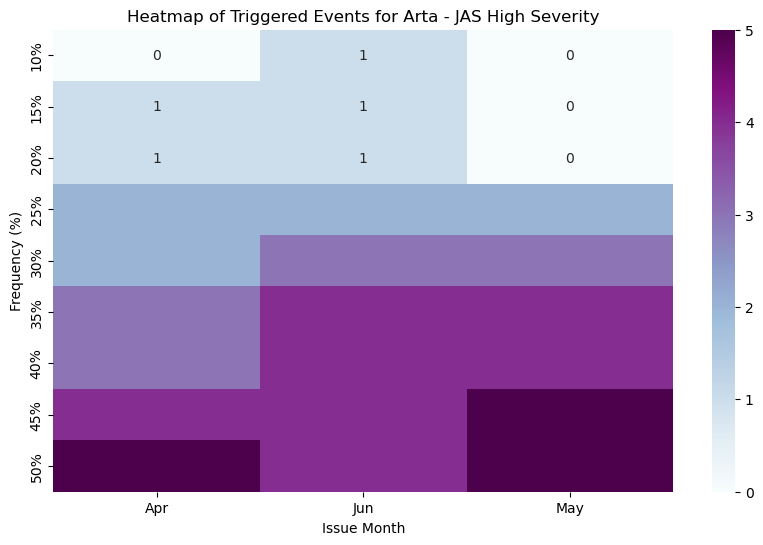

<Figure size 640x480 with 0 Axes>

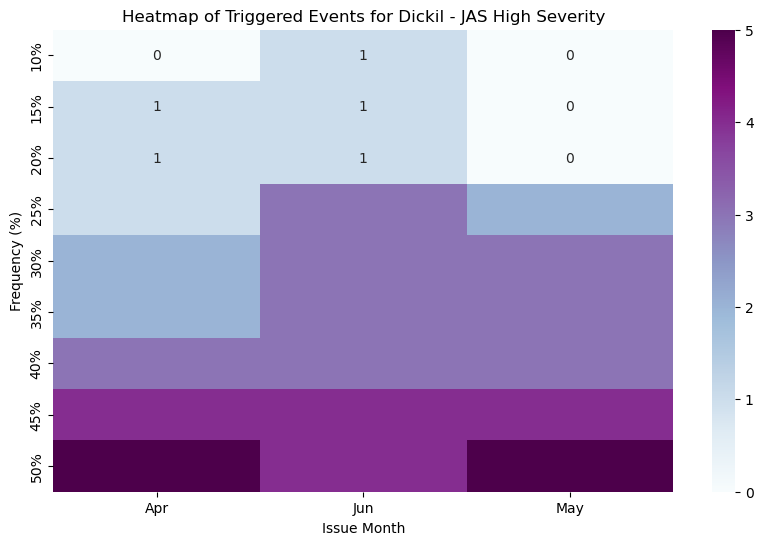

<Figure size 640x480 with 0 Axes>

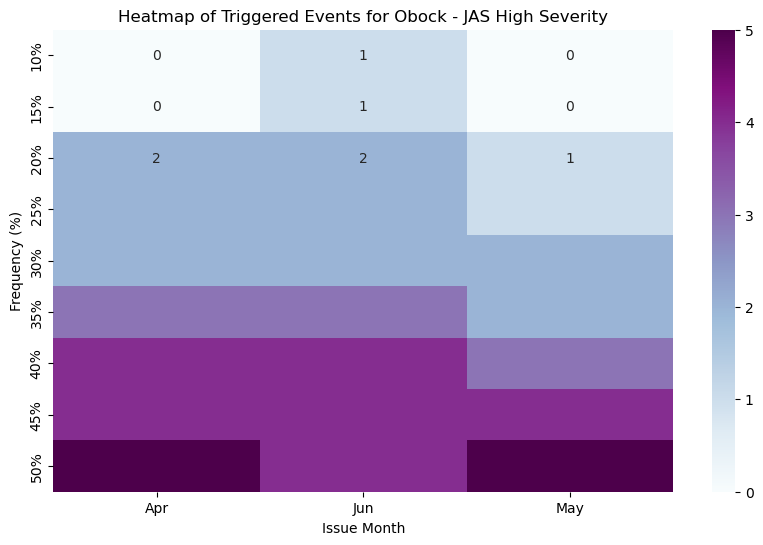

<Figure size 640x480 with 0 Axes>

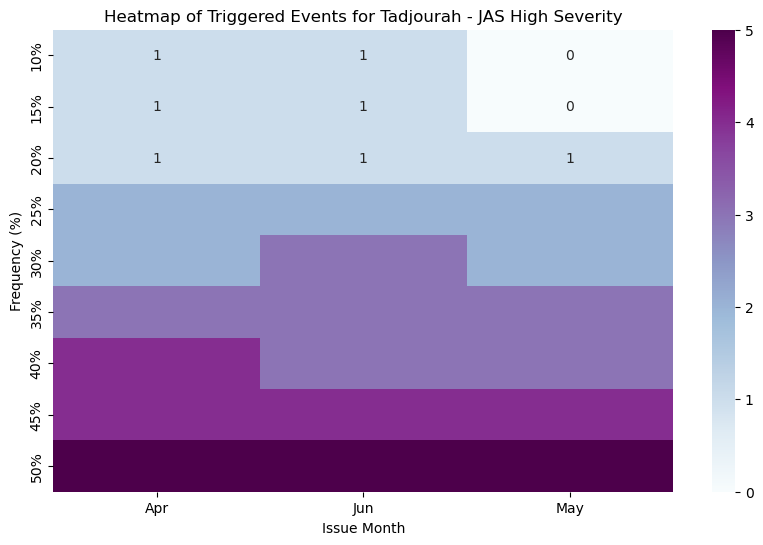

<Figure size 640x480 with 0 Axes>

In [12]:
u.generate_heatmaps_for_admin1(combined_admin1, season = 'JAS', severity = 'High Severity')

#### Threshold Protocol Analysis Using Trigger Differences

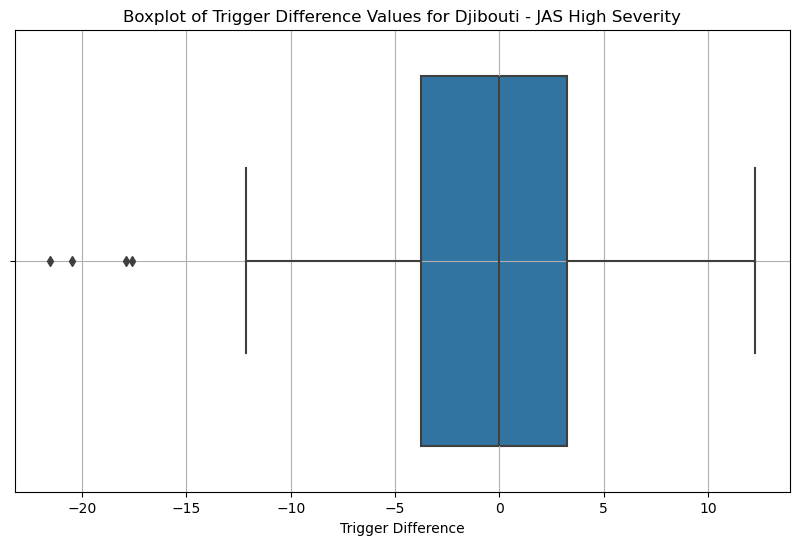

Quantile Ranges for Djibouti:
{0.0: -21.538214411819105, 0.25: -3.769544021349674, 0.5: -0.0232334804058425, 0.75: 3.2416002652554585, 1.0: 12.235288370121467}




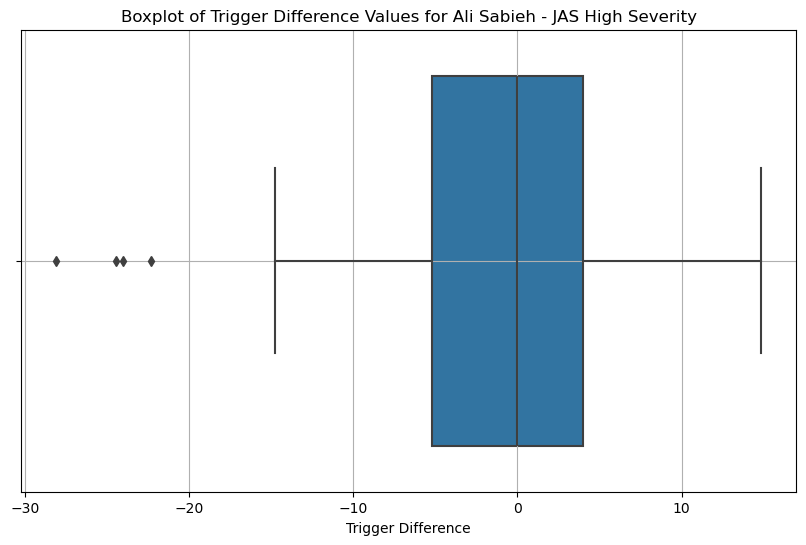

Quantile Ranges for Ali Sabieh:
{0.0: -28.071404726517606, 0.25: -5.215416800789868, 0.5: -0.032561812570829574, 0.75: 4.0005958968253745, 1.0: 14.824174616164427}




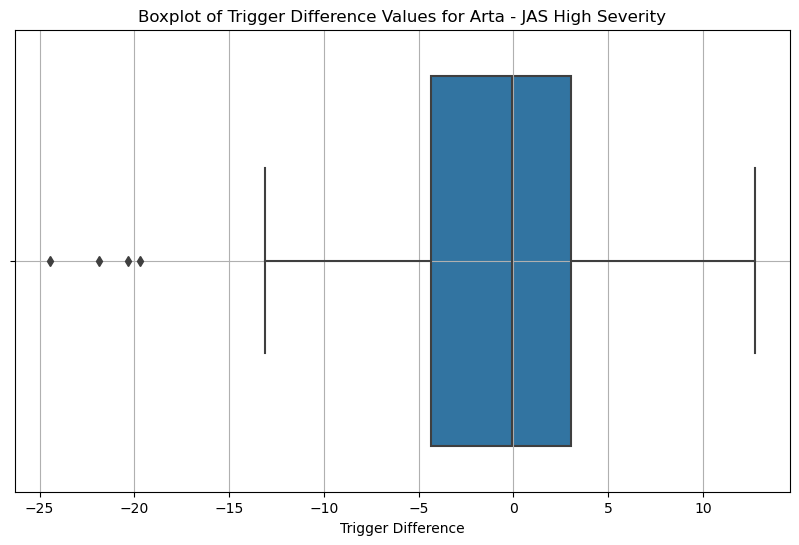

Quantile Ranges for Arta:
{0.0: -24.448219635276633, 0.25: -4.326691547106849, 0.5: -0.08649000411206131, 0.75: 3.022220400539668, 1.0: 12.73399886408113}




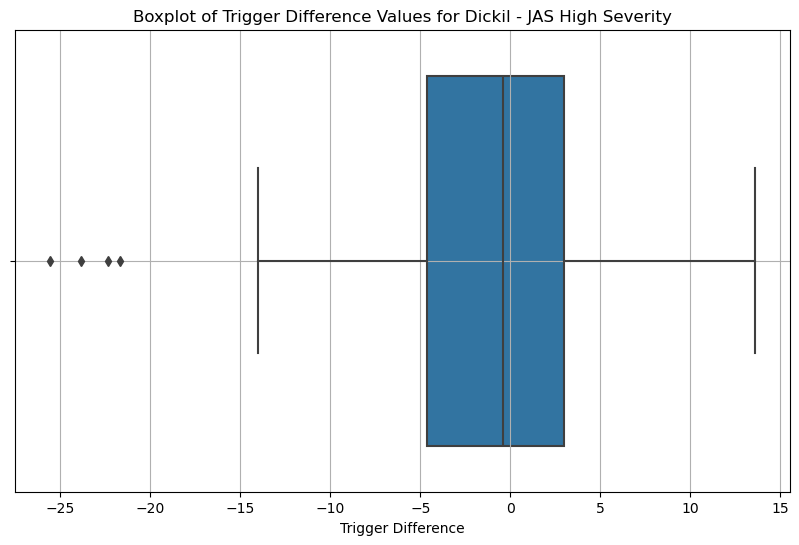

Quantile Ranges for Dickil:
{0.0: -25.577807274155532, 0.25: -4.633581118463452, 0.5: -0.42740242690528696, 0.75: 2.965260766188969, 1.0: 13.586561366411857}




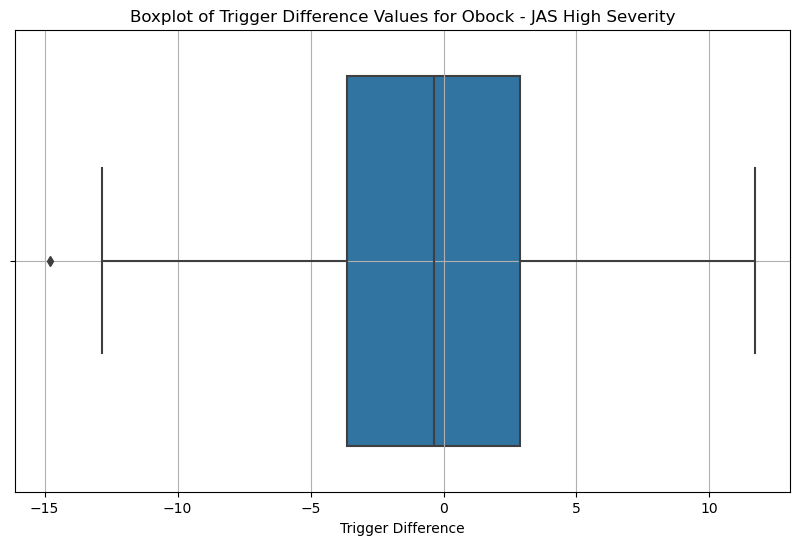

Quantile Ranges for Obock:
{0.0: -14.793089049744239, 0.25: -3.6132850566834547, 0.5: -0.3498456108125154, 0.75: 2.8904846926029197, 1.0: 11.698425128779562}




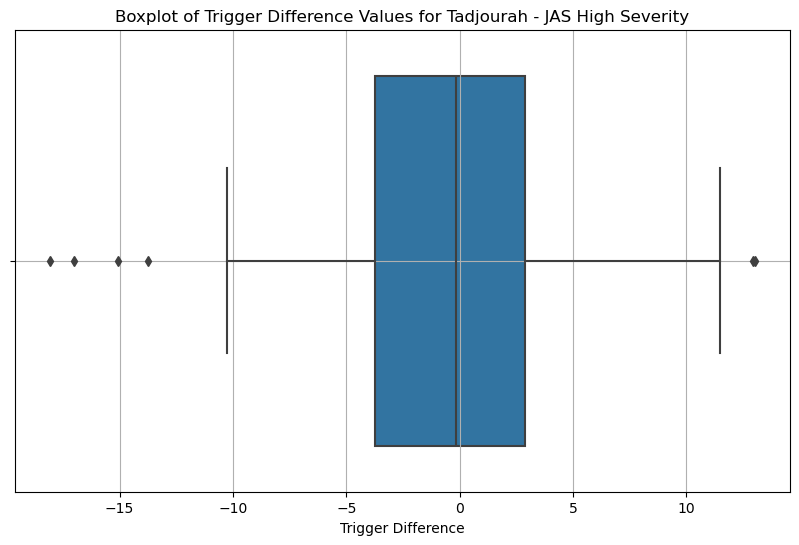

Quantile Ranges for Tadjourah:
{0.0: -18.06933240342869, 0.25: -3.7545479494143414, 0.5: -0.1692541456432295, 0.75: 2.8875256364413353, 1.0: 13.013094039387525}




In [13]:
u.plot_boxplots_and_quantiles_admin1(combined_admin1, season = 'JAS', severity = 'High Severity')

## Moderate Severity

In [14]:
# Bad Years collected during the stakeholder workshop

bad_years = [1997, 2005, 2008]

# Range of Frequencies

frequencies = list(range(5, 51, 5))

### National Level

#### Trigger Table

In [15]:
# Display Trigger Table at the National Level based on the Bad Years and Frequency

admin_tables = u.get_trigger_tables(maproom=maproom, mode=0, season=season, predictor=predictor, bad_years = bad_years,
                                              predictand=predictand, year = year, issue_month=issue_month, frequencies=frequencies,
                                              include_upcoming=include_upcoming, threshold_protocol=threshold_protocol,
                                              username=username, password=password,need_valid_keys=need_valid_keys,
                                              valid_keys=valid_keys)

combined_admin0 = pd.concat(admin_tables["admin0_tables"].values(), ignore_index=True)

u.style_and_render_df_with_hyperlinks(combined_admin0)

Fetching....


,Admin Name,Year,Frequency (%),Issue Month,Forecast,Forecast Threshold,Trigger Difference,Forecast Accuracy (%),Triggered,Adjusted Forecast Threshold,Threshold Protocol,Triggered Adjusted,Act in Vain,Fail to Act,Worthy Action,Worthy Inaction,Design Tool URL
0,Djibouti,2008,5%,Jun,15.30,32.88,-17.59,80.00%,False,32.88,0,False,1.0,5.0,0.0,24.0,Design Tool Link
1,Djibouti,2005,5%,Jun,9.24,32.88,-23.64,80.00%,False,32.88,0,False,1.0,5.0,0.0,24.0,Design Tool Link
2,Djibouti,1997,5%,Jun,32.88,32.88,0.00,80.00%,False,32.88,0,False,1.0,5.0,0.0,24.0,Design Tool Link
3,Djibouti,2008,5%,May,9.15,22.92,-13.77,80.00%,False,22.92,0,False,1.0,5.0,0.0,24.0,Design Tool Link
4,Djibouti,2005,5%,May,9.61,22.92,-13.31,80.00%,False,22.92,0,False,1.0,5.0,0.0,24.0,Design Tool Link
5,Djibouti,1997,5%,May,22.92,22.92,0.00,80.00%,False,22.92,0,False,1.0,5.0,0.0,24.0,Design Tool Link
6,Djibouti,2008,5%,Apr,11.51,22.77,-11.26,80.00%,False,22.77,0,False,1.0,5.0,0.0,24.0,Design Tool Link
7,Djibouti,2005,5%,Apr,12.42,22.77,-10.35,80.00%,False,22.77,0,False,1.0,5.0,0.0,24.0,Design Tool Link
8,Djibouti,1997,5%,Apr,20.09,22.77,-2.68,80.00%,False,22.77,0,False,1.0,5.0,0.0,24.0,Design Tool Link
9,Djibouti,2008,10%,Jun,18.59,25.33,-6.74,80.00%,False,25.33,0,False,2.0,4.0,1.0,23.0,Design Tool Link


In [16]:
# Filter for non - triggered events
non_triggered_events = combined_admin0[~combined_admin0['Triggered']]['Year'].unique()
print(non_triggered_events)

[2008 2005 1997]


#### Triggered Bad Years by Frequency and Issue Month

In [17]:
# Filter the data for triggered bad years and then summarize the counts by frequency and issue month.

# Filter for triggered bad years
triggered_events = combined_admin0[combined_admin0['Triggered']]

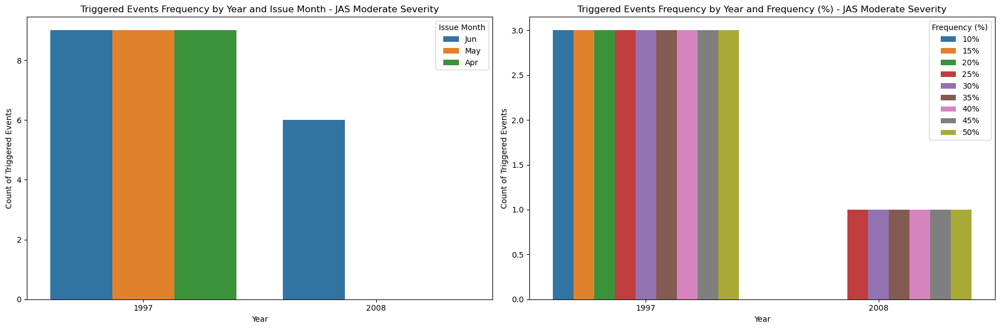

In [18]:
u.plot_triggered_events_admin0(triggered_events, season = 'JAS', severity = 'Moderate Severity')

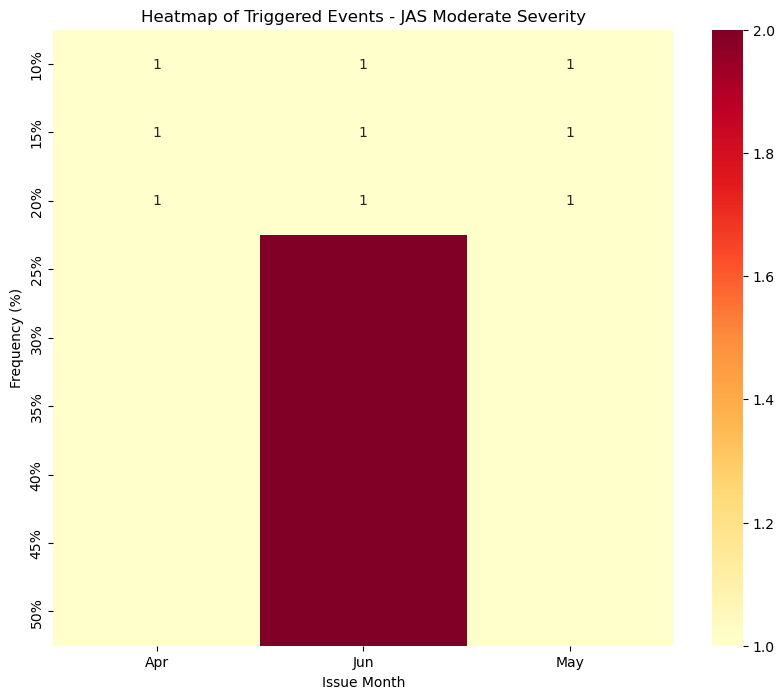

<Figure size 640x480 with 0 Axes>

In [19]:
u.plot_triggered_events_heatmap_admin0(triggered_events, season = 'JAS', severity = 'Moderate Severity')

#### Threshold Protocol Analysis Using Trigger Differences

Quantile Ranges for Trigger Difference - JAS Moderate Severity {0.0: -23.642303697120667, 0.25: -7.234407414400771, 0.5: -4.690782364884136, 0.75: 6.257009240192987, 1.0: 26.38389576771543}
{0.0: -23.642303697120667, 0.25: -7.234407414400771, 0.5: -4.690782364884136, 0.75: 6.257009240192987, 1.0: 26.38389576771543}




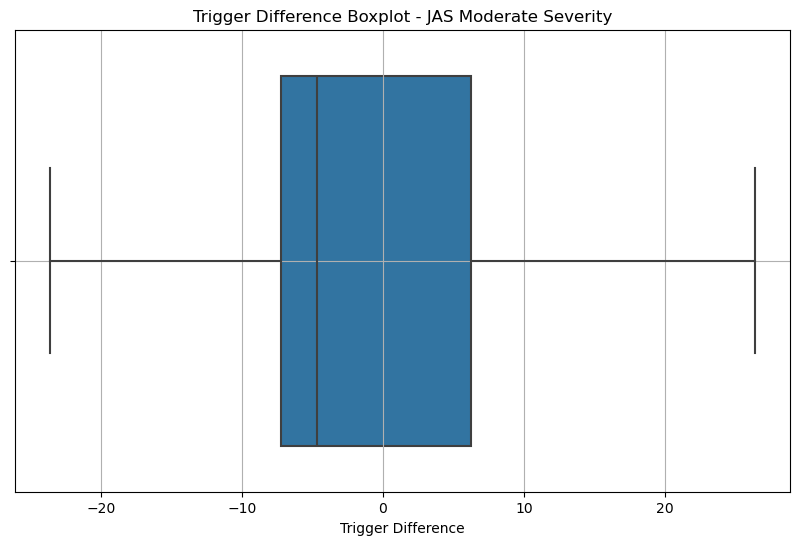

In [20]:
u.plot_trigger_difference_boxplot_admin0(combined_admin0, season = 'JAS', severity = 'Moderate Severity')

### Regional Level

#### Trigger Table

In [21]:
# Display Trigger Table at the National Level based on the Bad Years and Frequency

admin_tables = u.get_trigger_tables(maproom=maproom, mode=1, season=season, predictor=predictor, bad_years = bad_years,
                                              predictand=predictand, year = year, issue_month=issue_month, frequencies=frequencies,
                                              include_upcoming=include_upcoming, threshold_protocol=threshold_protocol,
                                              username=username, password=password,need_valid_keys=need_valid_keys,
                                              valid_keys=valid_keys)

combined_admin1 = pd.concat(admin_tables["admin1_tables"].values(), ignore_index=True)

u.style_and_render_df_with_hyperlinks(combined_admin1)

Fetching....


,Admin Name,Year,Frequency (%),Issue Month,Forecast,Forecast Threshold,Trigger Difference,Forecast Accuracy (%),Triggered,Adjusted Forecast Threshold,Threshold Protocol,Triggered Adjusted,Act in Vain,Fail to Act,Worthy Action,Worthy Inaction,Design Tool URL
0,Djibouti,2008,5%,Jun,15.69,35.24,-19.55,80.00%,False,35.24,0,False,1.0,5.0,0.0,24.0,Design Tool Link
1,Djibouti,2005,5%,Jun,11.64,35.24,-23.60,80.00%,False,35.24,0,False,1.0,5.0,0.0,24.0,Design Tool Link
2,Djibouti,1997,5%,Jun,35.24,35.24,0.00,80.00%,False,35.24,0,False,1.0,5.0,0.0,24.0,Design Tool Link
3,Ali Sabieh,2008,5%,Jun,14.71,39.23,-24.52,80.00%,False,39.23,0,False,1.0,5.0,0.0,24.0,Design Tool Link
4,Ali Sabieh,2005,5%,Jun,9.31,39.23,-29.92,80.00%,False,39.23,0,False,1.0,5.0,0.0,24.0,Design Tool Link
5,Ali Sabieh,1997,5%,Jun,39.23,39.23,0.00,80.00%,False,39.23,0,False,1.0,5.0,0.0,24.0,Design Tool Link
6,Arta,2008,5%,Jun,15.03,36.42,-21.39,80.00%,False,36.42,0,False,1.0,5.0,0.0,24.0,Design Tool Link
7,Arta,2005,5%,Jun,10.70,36.42,-25.72,80.00%,False,36.42,0,False,1.0,5.0,0.0,24.0,Design Tool Link
8,Arta,1997,5%,Jun,36.42,36.42,0.00,80.00%,False,36.42,0,False,1.0,5.0,0.0,24.0,Design Tool Link
9,Dickil,2008,5%,Jun,13.84,36.83,-22.99,80.00%,False,36.83,0,False,1.0,5.0,0.0,24.0,Design Tool Link


In [22]:
# Filter for non - triggered events
non_triggered_events = combined_admin1[~combined_admin1['Triggered']]['Year'].unique()
print(non_triggered_events)

[2008 2005 1997]


#### Triggered Bad Years by Frequency and Issue Month

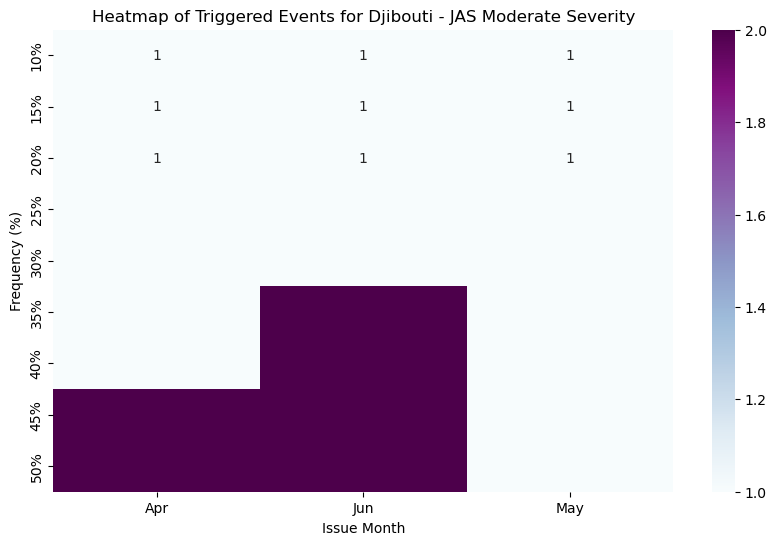

<Figure size 640x480 with 0 Axes>

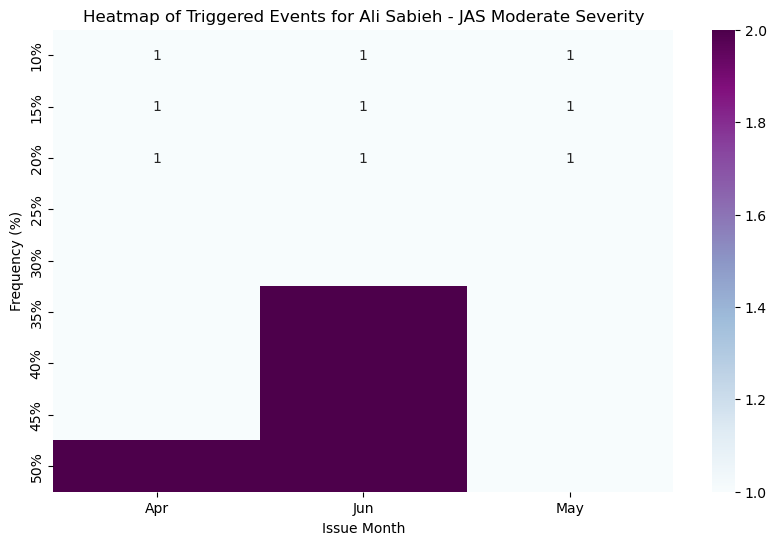

<Figure size 640x480 with 0 Axes>

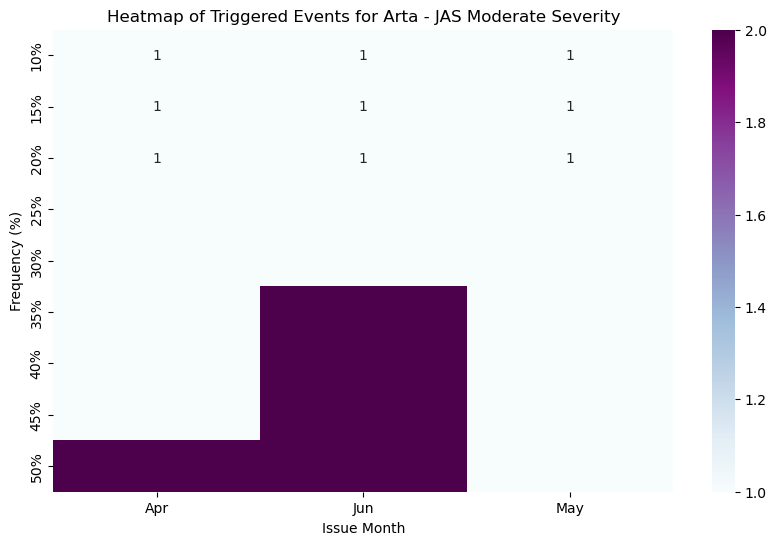

<Figure size 640x480 with 0 Axes>

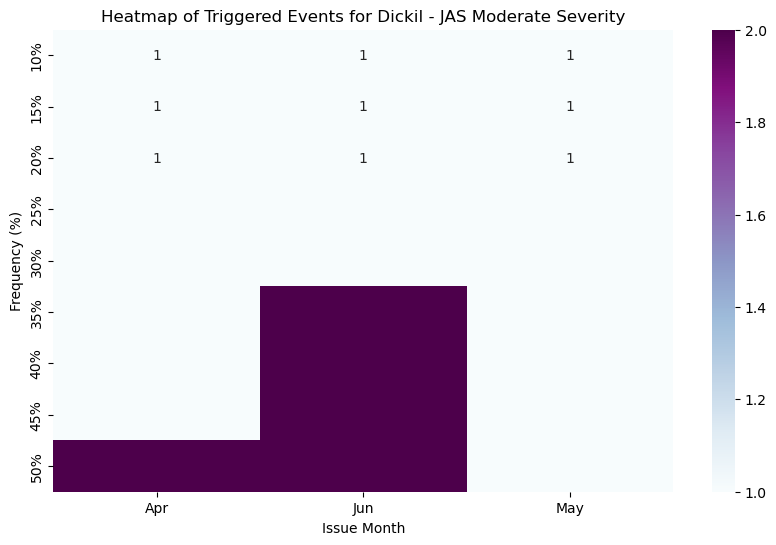

<Figure size 640x480 with 0 Axes>

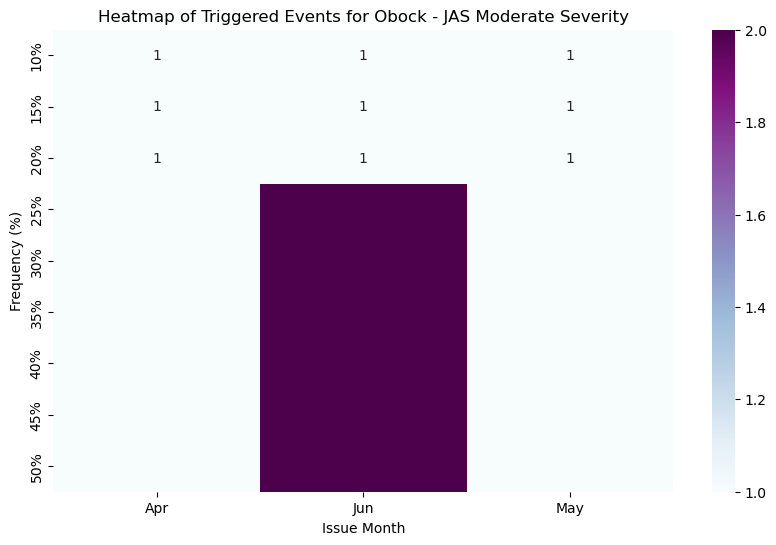

<Figure size 640x480 with 0 Axes>

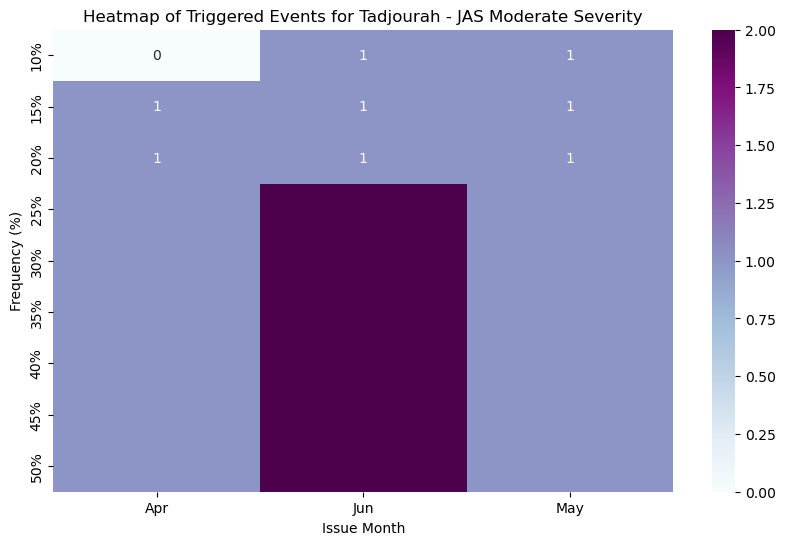

<Figure size 640x480 with 0 Axes>

In [23]:
u.generate_heatmaps_for_admin1(combined_admin1, season = 'JAS', severity = 'Moderate Severity')

#### Threshold Protocol Analysis Using Trigger Differences

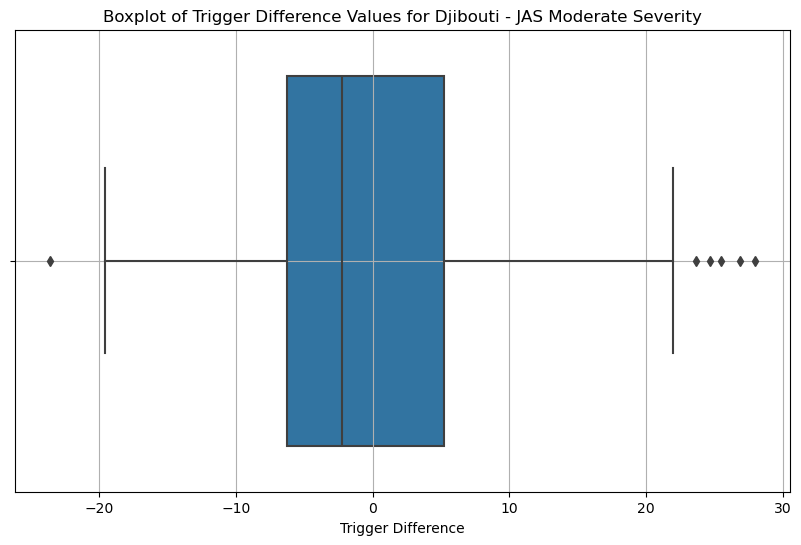

Quantile Ranges for Djibouti:
{0.0: -23.598578847857613, 0.25: -6.256450527873635, 0.5: -2.2118328321231218, 0.75: 5.187525581430625, 1.0: 27.939701272505552}




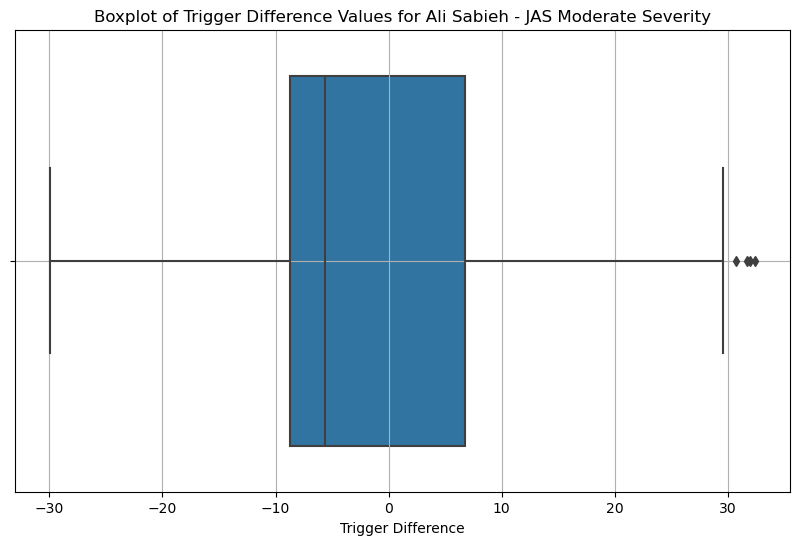

Quantile Ranges for Ali Sabieh:
{0.0: -29.921901031540855, 0.25: -8.705423239280918, 0.5: -5.61279922712049, 0.75: 6.708923905153251, 1.0: 32.343595130911666}




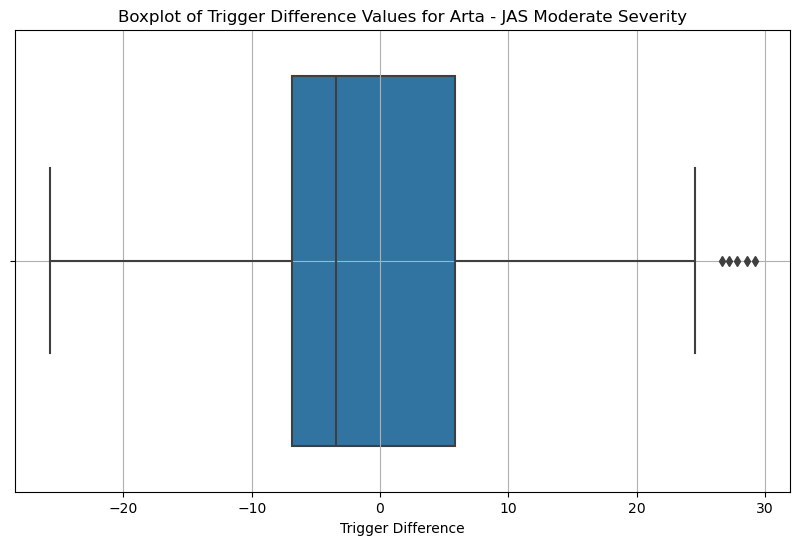

Quantile Ranges for Arta:
{0.0: -25.715493445222357, 0.25: -6.846067516612621, 0.5: -3.445180500521774, 0.75: 5.849872248187392, 1.0: 29.1981257944744}




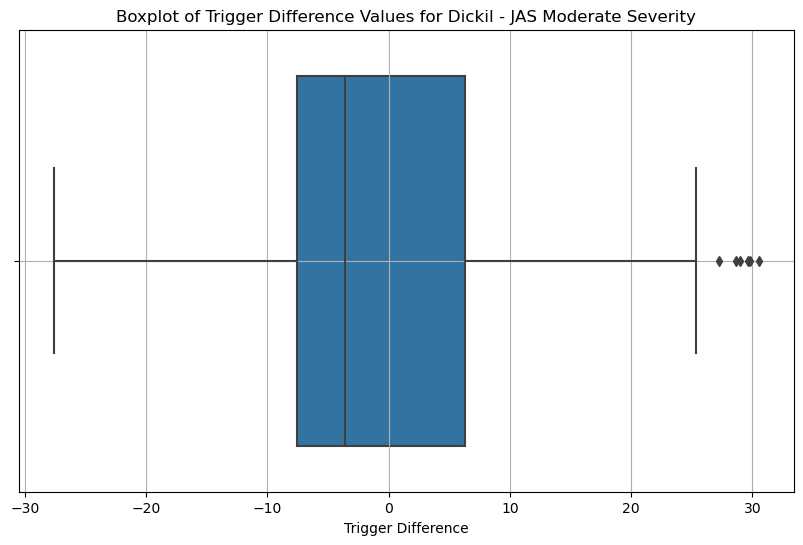

Quantile Ranges for Dickil:
{0.0: -27.58594591846054, 0.25: -7.511366410524139, 0.5: -3.6160664968210856, 0.75: 6.2631522446209855, 1.0: 30.496210282480263}




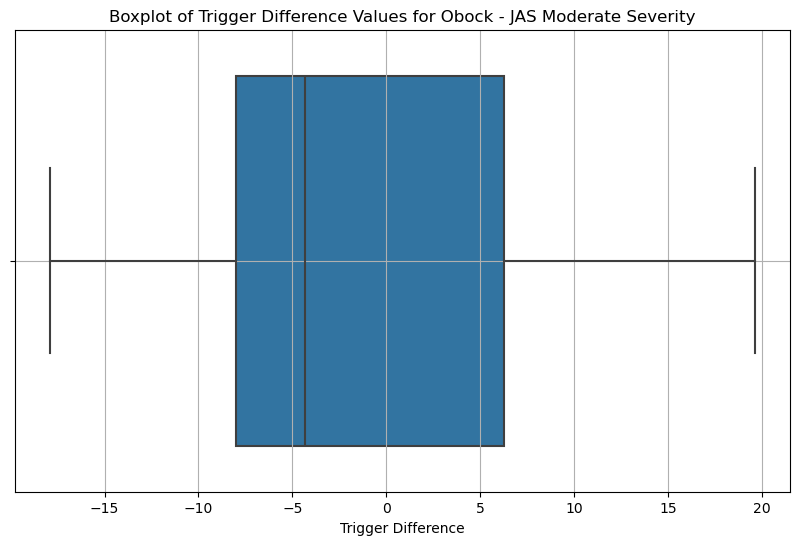

Quantile Ranges for Obock:
{0.0: -17.89745157916611, 0.25: -8.015464815633763, 0.5: -4.307383450121211, 0.75: 6.257528203378387, 1.0: 19.610798488154195}




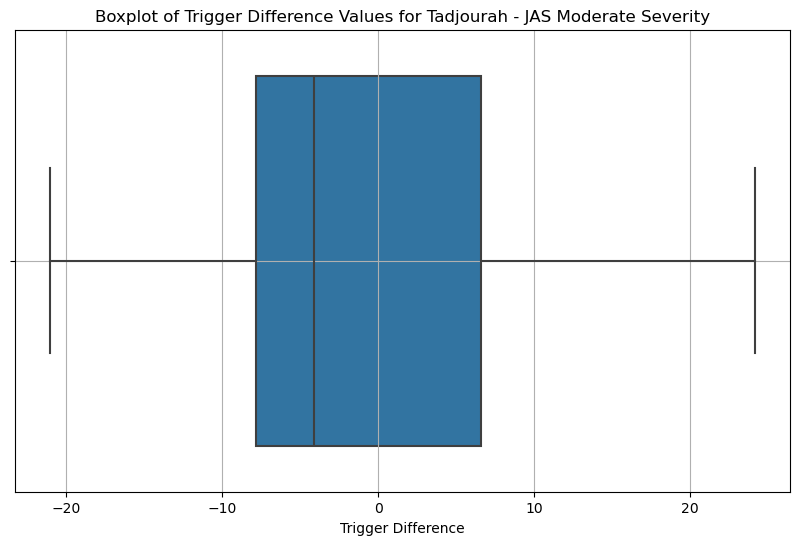

Quantile Ranges for Tadjourah:
{0.0: -21.03137161965966, 0.25: -7.8516325232956286, 0.5: -4.137348067931773, 0.75: 6.615886897563098, 1.0: 24.138041720001574}




In [24]:
u.plot_boxplots_and_quantiles_admin1(combined_admin1, season = 'JAS', severity = 'Moderate Severity')

# MAM Season

In [25]:
# Loading Country Variables

maproom = "djibouti-mam"

config = u.load_config()

# Accessing values for the specified maproom

country_config = config.get("maprooms", {}).get(maproom, {})

# Access individual values using the 'maproom' variable

country = country_config.get("country")
modes = country_config.get("mode", [])
year = country_config.get("year")
season = country_config.get("season")
target_season = country_config.get("target_season")
issue_month = country_config['issue_month']
predictor = country_config['predictor']
predictand = country_config['predictand']
include_upcoming = country_config['include_upcoming']
design_tool = country_config['design_tool']
report = country_config['report']
username = country_config['username']
password = country_config['password']
threshold_protocol = country_config['threshold_protocol']
need_valid_keys = country_config['need_valid_keys']
valid_keys = country_config['admin1_list']

## High Severity

In [26]:
# Bad Years collected during the stakeholder workshop

bad_years = [1984, 1992, 1997, 2006, 2008, 2009, 2011, 2012, 2014, 2015, 2021]

# Range of Frequencies

frequencies = list(range(5, 51, 5))

### National Level

#### Trigger Table

In [27]:
# Display Trigger Table at the National Level based on the Bad Years and Frequency

admin_tables = u.get_trigger_tables(maproom=maproom, mode=0, season=season, predictor=predictor, bad_years = bad_years,
                                              predictand=predictand, year = year, issue_month=issue_month, frequencies=frequencies,
                                              include_upcoming=include_upcoming, threshold_protocol=threshold_protocol,
                                              username=username, password=password,need_valid_keys=need_valid_keys,
                                              valid_keys=valid_keys)

combined_admin0 = pd.concat(admin_tables["admin0_tables"].values(), ignore_index=True)

u.style_and_render_df_with_hyperlinks(combined_admin0)

Fetching....


,Admin Name,Year,Frequency (%),Issue Month,Forecast,Forecast Threshold,Trigger Difference,Forecast Accuracy (%),Triggered,Adjusted Forecast Threshold,Threshold Protocol,Triggered Adjusted,Act in Vain,Fail to Act,Worthy Action,Worthy Inaction,Design Tool URL
0,Djibouti,2021,5%,Feb,nan,27.81,nan,80.00%,False,27.81,0,False,1.0,5.0,0.0,24.0,Design Tool Link
1,Djibouti,2015,5%,Feb,15.23,27.81,-12.57,80.00%,False,27.81,0,False,1.0,5.0,0.0,24.0,Design Tool Link
2,Djibouti,2014,5%,Feb,14.75,27.81,-13.06,80.00%,False,27.81,0,False,1.0,5.0,0.0,24.0,Design Tool Link
3,Djibouti,2012,5%,Feb,20.46,27.81,-7.35,80.00%,False,27.81,0,False,1.0,5.0,0.0,24.0,Design Tool Link
4,Djibouti,2011,5%,Feb,21.85,27.81,-5.96,80.00%,False,27.81,0,False,1.0,5.0,0.0,24.0,Design Tool Link
5,Djibouti,2009,5%,Feb,18.79,27.81,-9.01,80.00%,False,27.81,0,False,1.0,5.0,0.0,24.0,Design Tool Link
6,Djibouti,2008,5%,Feb,27.81,27.81,0.00,80.00%,False,27.81,0,False,1.0,5.0,0.0,24.0,Design Tool Link
7,Djibouti,2006,5%,Feb,22.66,27.81,-5.15,80.00%,False,27.81,0,False,1.0,5.0,0.0,24.0,Design Tool Link
8,Djibouti,1997,5%,Feb,16.38,27.81,-11.43,80.00%,False,27.81,0,False,1.0,5.0,0.0,24.0,Design Tool Link
9,Djibouti,1992,5%,Feb,14.78,27.81,-13.02,80.00%,False,27.81,0,False,1.0,5.0,0.0,24.0,Design Tool Link


In [28]:
# Filter for non - triggered events
non_triggered_events = combined_admin0[~combined_admin0['Triggered']]['Year'].unique()
print(non_triggered_events)

[2021 2015 2014 2012 2011 2009 2008 2006 1997 1992]


#### Triggered Bad Years by Frequency and Issue Month

In [29]:
# Filter the data for triggered bad years and then summarize the counts by frequency and issue month.

# Filter for triggered bad years
triggered_events = combined_admin0[combined_admin0['Triggered']]

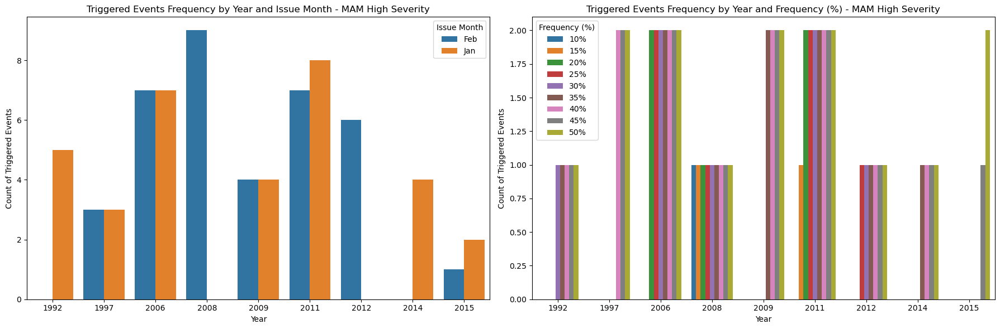

In [30]:
u.plot_triggered_events_admin0(triggered_events, season = 'MAM', severity = 'High Severity')

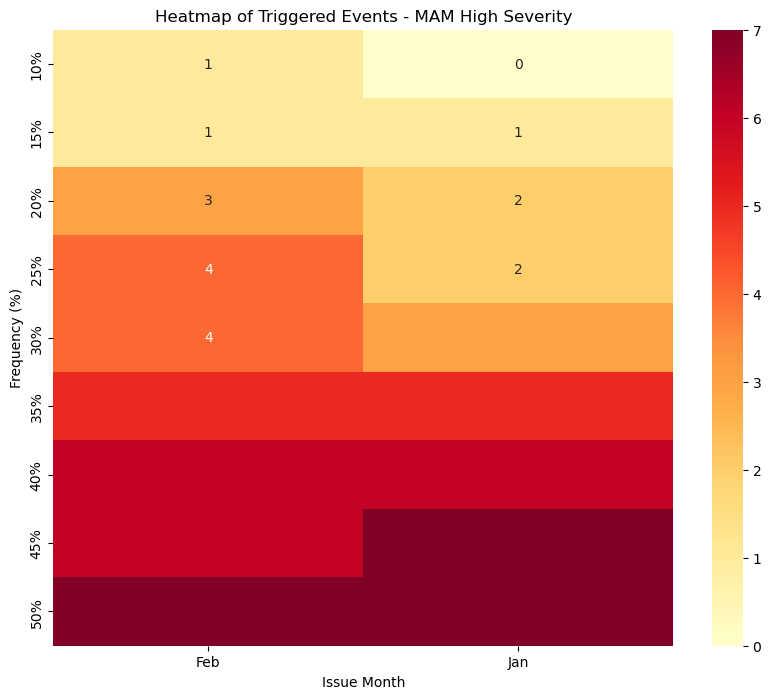

<Figure size 640x480 with 0 Axes>

In [31]:
u.plot_triggered_events_heatmap_admin0(triggered_events, season = 'MAM', severity = 'High Severity')

#### Threshold Protocol Analysis Using Trigger Differences

Quantile Ranges for Trigger Difference - MAM High Severity {0.0: -16.267454743381304, 0.25: -4.944413082567133, 0.5: -0.779897176443038, 0.75: 2.580086750015555, 1.0: 16.580478964184536}
{0.0: -16.267454743381304, 0.25: -4.944413082567133, 0.5: -0.779897176443038, 0.75: 2.580086750015555, 1.0: 16.580478964184536}




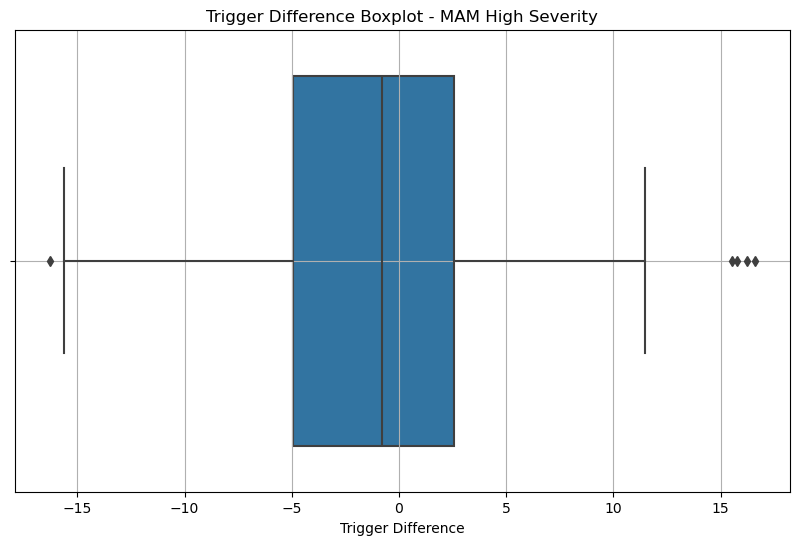

In [32]:
u.plot_trigger_difference_boxplot_admin0(combined_admin0, season = 'MAM', severity = 'High Severity')

### Regional Level

#### Trigger Table

In [33]:
# Display Trigger Table at the National Level based on the Bad Years and Frequency

admin_tables = u.get_trigger_tables(maproom=maproom, mode=1, season=season, predictor=predictor, bad_years = bad_years,
                                              predictand=predictand, year = year, issue_month=issue_month, frequencies=frequencies,
                                              include_upcoming=include_upcoming, threshold_protocol=threshold_protocol,
                                              username=username, password=password,need_valid_keys=need_valid_keys,
                                              valid_keys=valid_keys)

combined_admin1 = pd.concat(admin_tables["admin1_tables"].values(), ignore_index=True)

u.style_and_render_df_with_hyperlinks(combined_admin1)

Fetching....


,Admin Name,Year,Frequency (%),Issue Month,Forecast,Forecast Threshold,Trigger Difference,Forecast Accuracy (%),Triggered,Adjusted Forecast Threshold,Threshold Protocol,Triggered Adjusted,Act in Vain,Fail to Act,Worthy Action,Worthy Inaction,Design Tool URL
0,Djibouti,2021,5%,Feb,nan,30.26,nan,80.00%,False,30.26,0,False,1.0,5.0,0.0,24.0,Design Tool Link
1,Djibouti,2015,5%,Feb,15.26,30.26,-15.00,80.00%,False,30.26,0,False,1.0,5.0,0.0,24.0,Design Tool Link
2,Djibouti,2014,5%,Feb,15.30,30.26,-14.96,80.00%,False,30.26,0,False,1.0,5.0,0.0,24.0,Design Tool Link
3,Djibouti,2012,5%,Feb,21.51,30.26,-8.75,80.00%,False,30.26,0,False,1.0,5.0,0.0,24.0,Design Tool Link
4,Djibouti,2011,5%,Feb,21.78,30.26,-8.48,80.00%,False,30.26,0,False,1.0,5.0,0.0,24.0,Design Tool Link
5,Djibouti,2009,5%,Feb,19.74,30.26,-10.52,80.00%,False,30.26,0,False,1.0,5.0,0.0,24.0,Design Tool Link
6,Djibouti,2008,5%,Feb,29.43,30.26,-0.83,80.00%,False,30.26,0,False,1.0,5.0,0.0,24.0,Design Tool Link
7,Djibouti,2006,5%,Feb,25.28,30.26,-4.98,80.00%,False,30.26,0,False,1.0,5.0,0.0,24.0,Design Tool Link
8,Djibouti,1997,5%,Feb,17.00,30.26,-13.26,80.00%,False,30.26,0,False,1.0,5.0,0.0,24.0,Design Tool Link
9,Djibouti,1992,5%,Feb,16.60,30.26,-13.66,80.00%,False,30.26,0,False,1.0,5.0,0.0,24.0,Design Tool Link


In [34]:
# Filter for non - triggered events
non_triggered_events = combined_admin1[~combined_admin1['Triggered']]['Year'].unique()
print(non_triggered_events)

[2021 2015 2014 2012 2011 2009 2008 2006 1997 1992]


#### Triggered Bad Years by Frequency and Issue Month

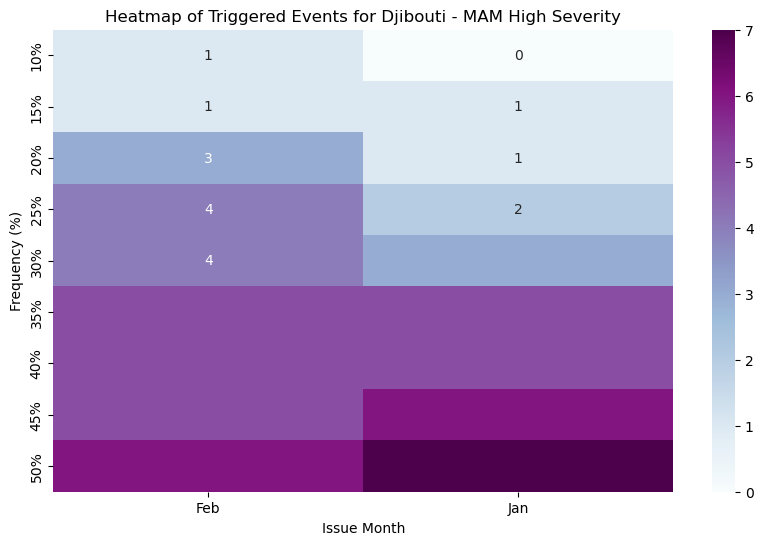

<Figure size 640x480 with 0 Axes>

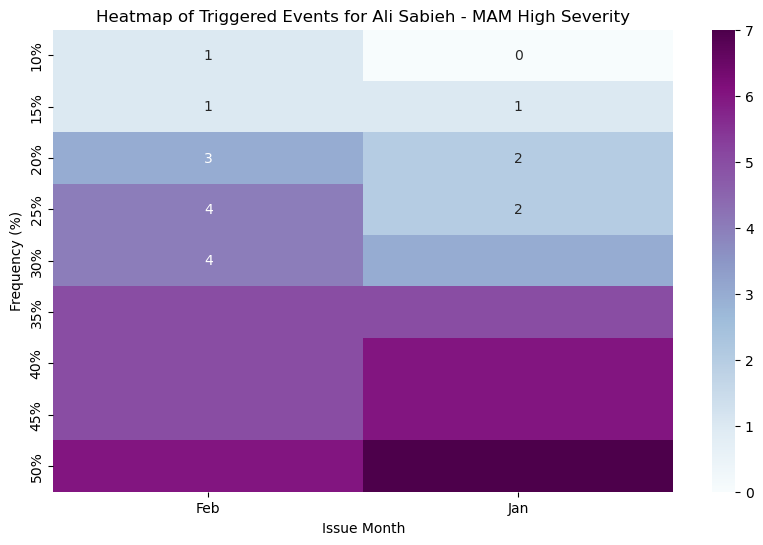

<Figure size 640x480 with 0 Axes>

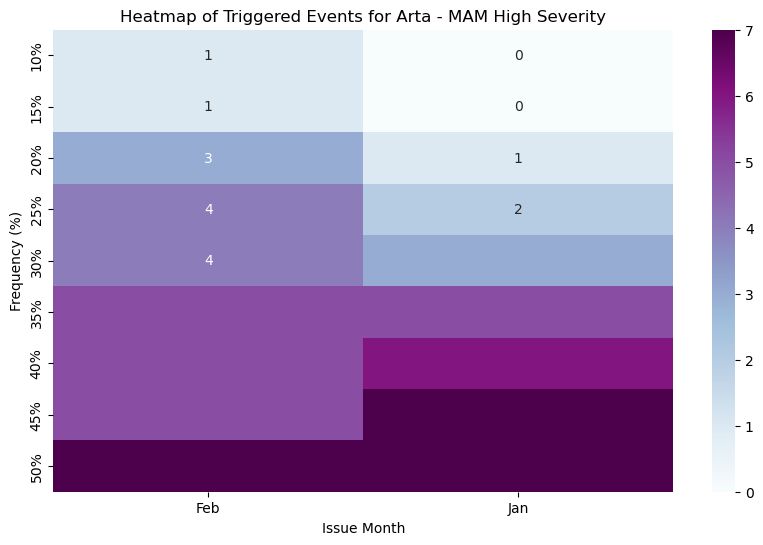

<Figure size 640x480 with 0 Axes>

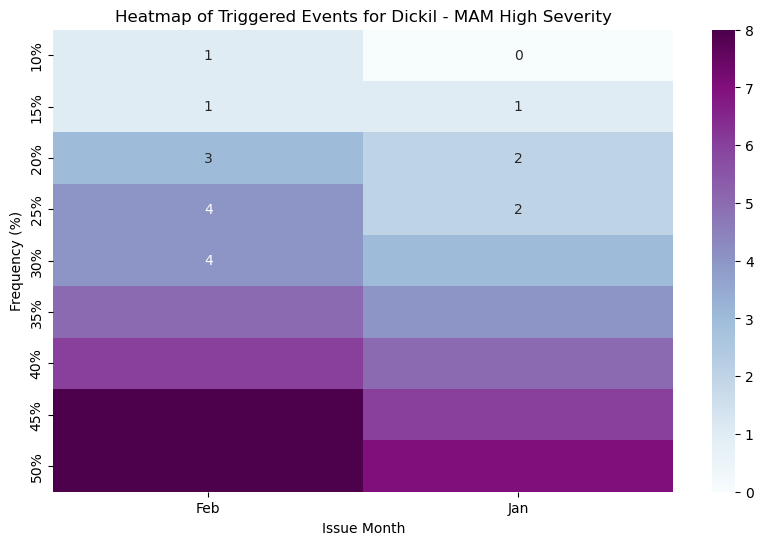

<Figure size 640x480 with 0 Axes>

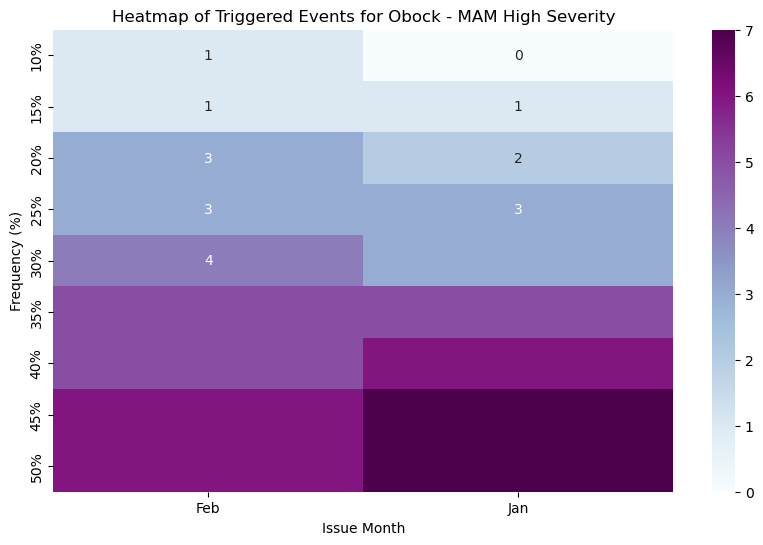

<Figure size 640x480 with 0 Axes>

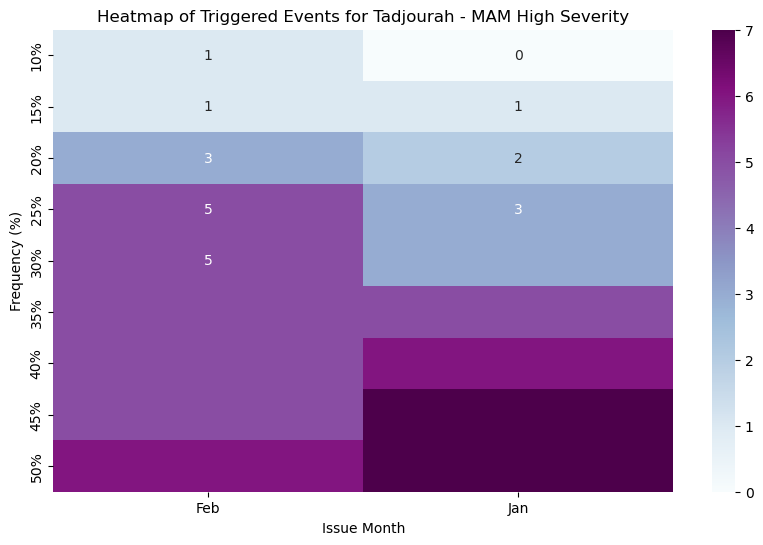

<Figure size 640x480 with 0 Axes>

In [35]:
u.generate_heatmaps_for_admin1(combined_admin1, season = 'MAM', severity = 'High Severity')

#### Threshold Protocol Analysis Using Trigger Differences

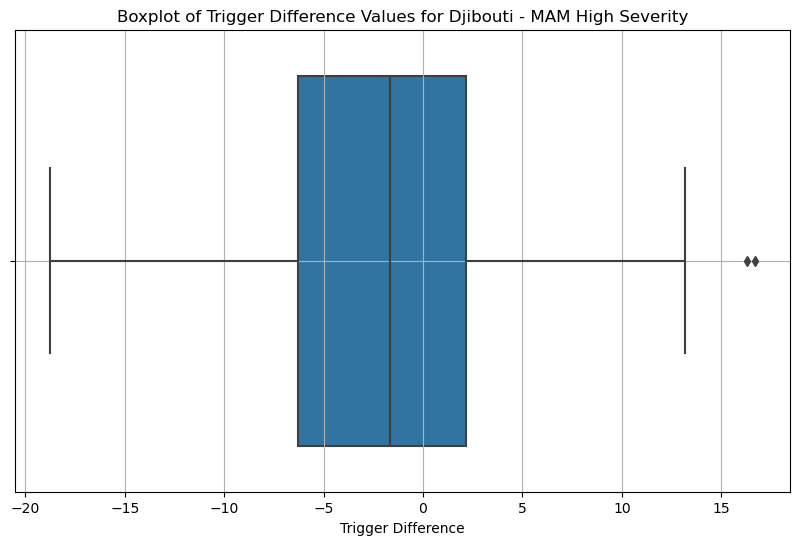

Quantile Ranges for Djibouti:
{0.0: -18.76193238799725, 0.25: -6.28509782328768, 0.5: -1.6675503243403504, 0.75: 2.1653709747059935, 1.0: 16.680157633796163}




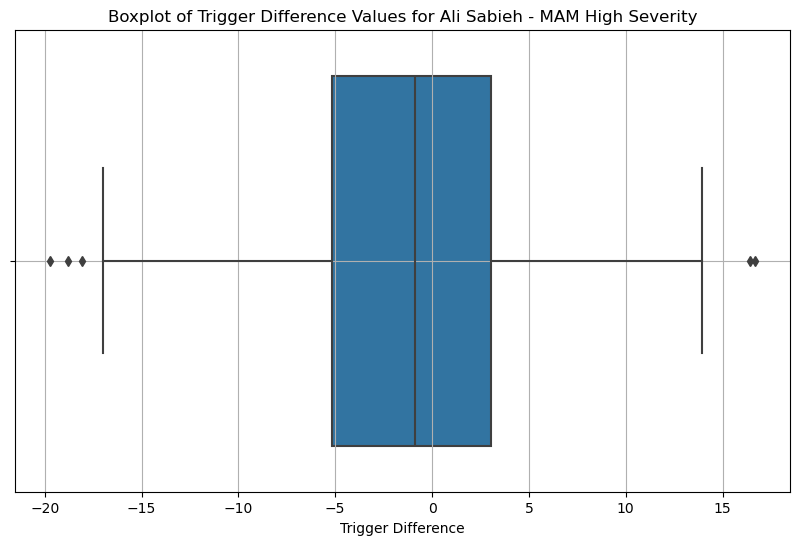

Quantile Ranges for Ali Sabieh:
{0.0: -19.725709551960687, 0.25: -5.15989598650481, 0.5: -0.8586038877056836, 0.75: 3.034575609348199, 1.0: 16.657226590921965}




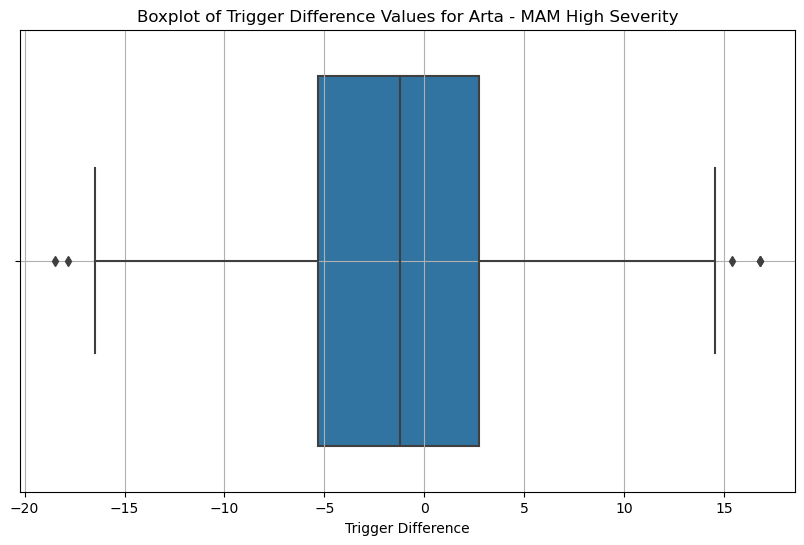

Quantile Ranges for Arta:
{0.0: -18.47745799090042, 0.25: -5.319400698600548, 0.5: -1.226475389520786, 0.75: 2.7399191920012615, 1.0: 16.78700440278414}




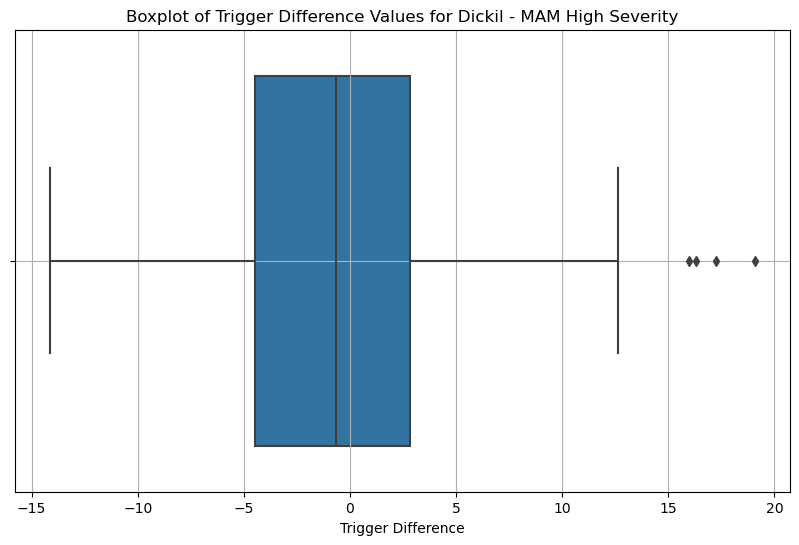

Quantile Ranges for Dickil:
{0.0: -14.129991056570914, 0.25: -4.489831894614989, 0.5: -0.6804474696672642, 0.75: 2.8327132322340614, 1.0: 19.06467369127172}




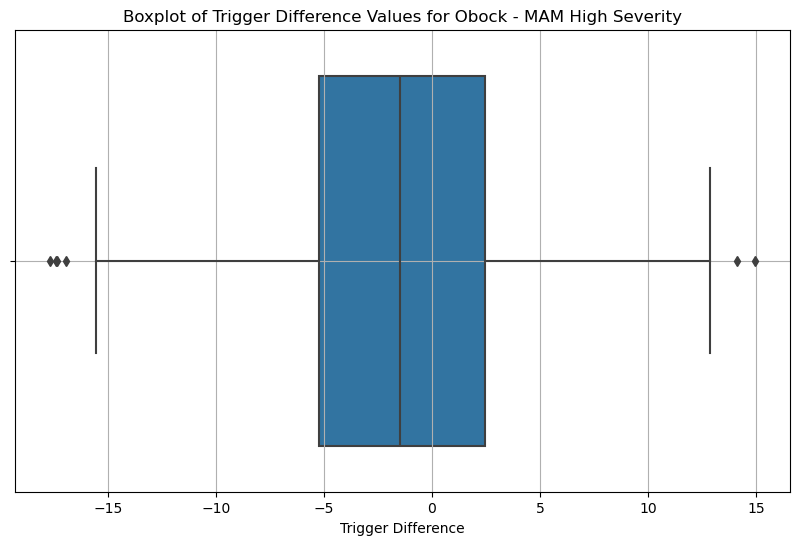

Quantile Ranges for Obock:
{0.0: -17.672950640739717, 0.25: -5.2113459209080215, 0.5: -1.4706631684124538, 0.75: 2.446218680200545, 1.0: 14.92742911245589}




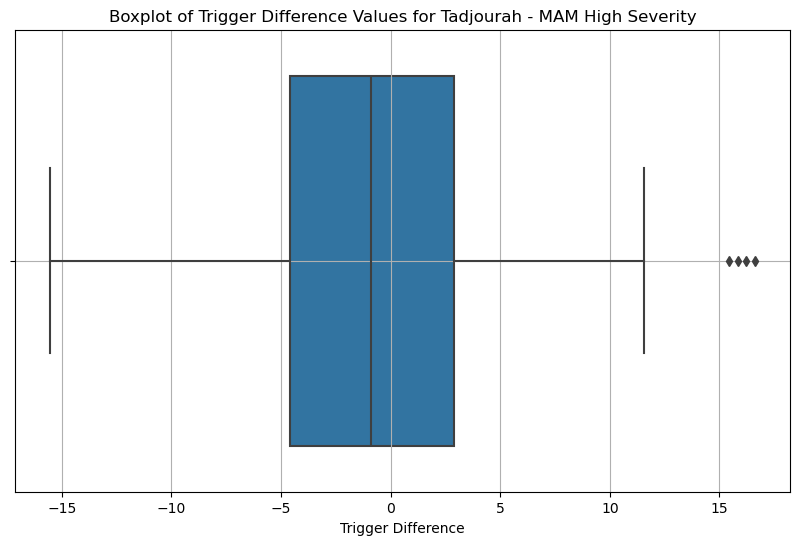

Quantile Ranges for Tadjourah:
{0.0: -15.53810133280242, 0.25: -4.583416056904152, 0.5: -0.8786752942870173, 0.75: 2.8836898796547796, 1.0: 16.606202501238236}




In [36]:
u.plot_boxplots_and_quantiles_admin1(combined_admin1, season = 'MAM', severity = 'High Severity')

## Moderate Severity

In [37]:
# Bad Years collected during the stakeholder workshop

bad_years = [1991, 1994, 1999, 2000, 2002, 2007, 2019]

# Range of Frequencies

frequencies = list(range(5, 51, 5))

### National Level

#### Trigger Table

In [38]:
# Display Trigger Table at the National Level based on the Bad Years and Frequency

admin_tables = u.get_trigger_tables(maproom=maproom, mode=0, season=season, predictor=predictor, bad_years = bad_years,
                                              predictand=predictand, year = year, issue_month=issue_month, frequencies=frequencies,
                                              include_upcoming=include_upcoming, threshold_protocol=threshold_protocol,
                                              username=username, password=password,need_valid_keys=need_valid_keys,
                                              valid_keys=valid_keys)

combined_admin0 = pd.concat(admin_tables["admin0_tables"].values(), ignore_index=True)

u.style_and_render_df_with_hyperlinks(combined_admin0)

Fetching....


,Admin Name,Year,Frequency (%),Issue Month,Forecast,Forecast Threshold,Trigger Difference,Forecast Accuracy (%),Triggered,Adjusted Forecast Threshold,Threshold Protocol,Triggered Adjusted,Act in Vain,Fail to Act,Worthy Action,Worthy Inaction,Design Tool URL
0,Djibouti,2019,5%,Feb,15.50,27.81,-12.31,80.00%,False,27.81,0,False,1.0,5.0,0.0,24.0,Design Tool Link
1,Djibouti,2007,5%,Feb,12.15,27.81,-15.66,80.00%,False,27.81,0,False,1.0,5.0,0.0,24.0,Design Tool Link
2,Djibouti,2002,5%,Feb,10.38,27.81,-17.42,80.00%,False,27.81,0,False,1.0,5.0,0.0,24.0,Design Tool Link
3,Djibouti,2000,5%,Feb,24.90,27.81,-2.91,80.00%,False,27.81,0,False,1.0,5.0,0.0,24.0,Design Tool Link
4,Djibouti,1999,5%,Feb,27.55,27.81,-0.26,80.00%,False,27.81,0,False,1.0,5.0,0.0,24.0,Design Tool Link
5,Djibouti,1994,5%,Feb,14.34,27.81,-13.47,80.00%,False,27.81,0,False,1.0,5.0,0.0,24.0,Design Tool Link
6,Djibouti,1991,5%,Feb,8.64,27.81,-19.17,80.00%,False,27.81,0,False,1.0,5.0,0.0,24.0,Design Tool Link
7,Djibouti,2019,5%,Jan,14.61,32.82,-18.20,80.00%,False,32.82,0,False,1.0,5.0,0.0,24.0,Design Tool Link
8,Djibouti,2007,5%,Jan,18.45,32.82,-14.37,80.00%,False,32.82,0,False,1.0,5.0,0.0,24.0,Design Tool Link
9,Djibouti,2002,5%,Jan,10.95,32.82,-21.87,80.00%,False,32.82,0,False,1.0,5.0,0.0,24.0,Design Tool Link


In [39]:
# Filter for non - triggered events
non_triggered_events = combined_admin0[~combined_admin0['Triggered']]['Year'].unique()
print(non_triggered_events)

[2019 2007 2002 2000 1999 1994 1991]


#### Triggered Bad Years by Frequency and Issue Month

In [40]:
# Filter the data for triggered bad years and then summarize the counts by frequency and issue month.

# Filter for triggered bad years
triggered_events = combined_admin0[combined_admin0['Triggered']]

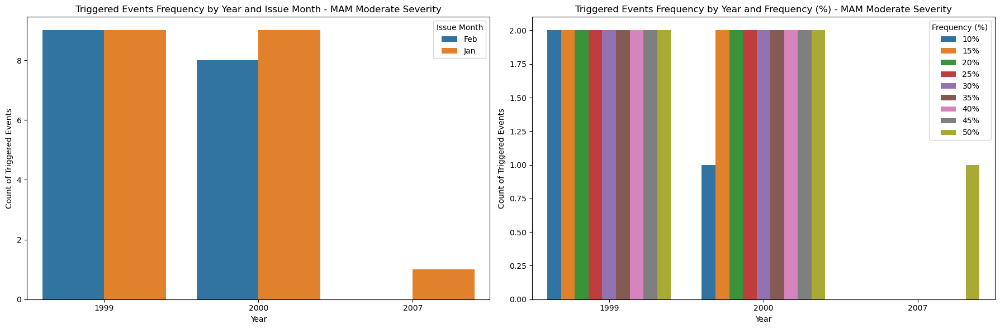

In [41]:
u.plot_triggered_events_admin0(triggered_events, season = 'MAM', severity = 'Moderate Severity')

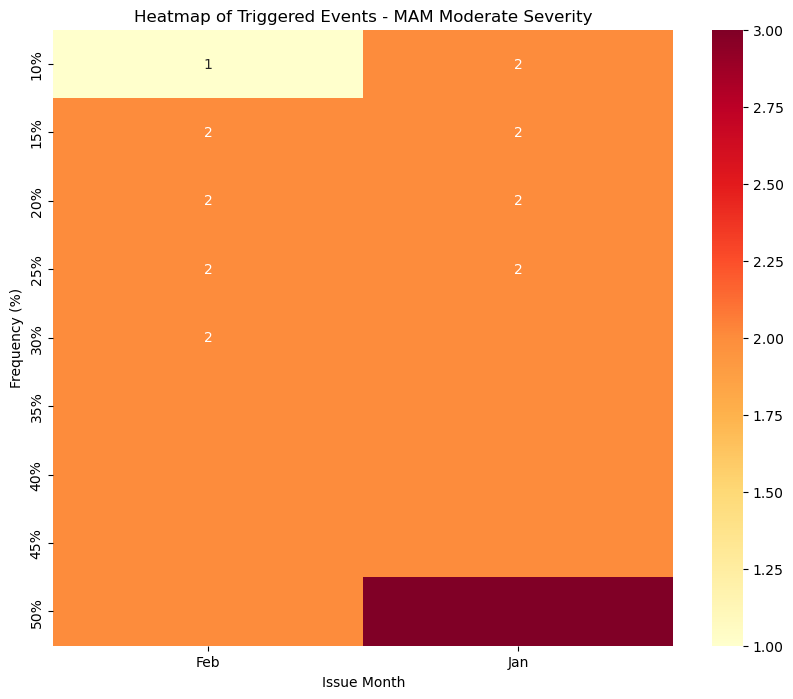

<Figure size 640x480 with 0 Axes>

In [42]:
u.plot_triggered_events_heatmap_admin0(triggered_events, season = 'MAM', severity = 'Moderate Severity')

#### Threshold Protocol Analysis Using Trigger Differences

Quantile Ranges for Trigger Difference - MAM Moderate Severity {0.0: -23.40642242072687, 0.25: -13.43827266115597, 0.5: -6.913978681409462, 0.75: 2.024420670096873, 1.0: 19.355457201893806}
{0.0: -23.40642242072687, 0.25: -13.43827266115597, 0.5: -6.913978681409462, 0.75: 2.024420670096873, 1.0: 19.355457201893806}




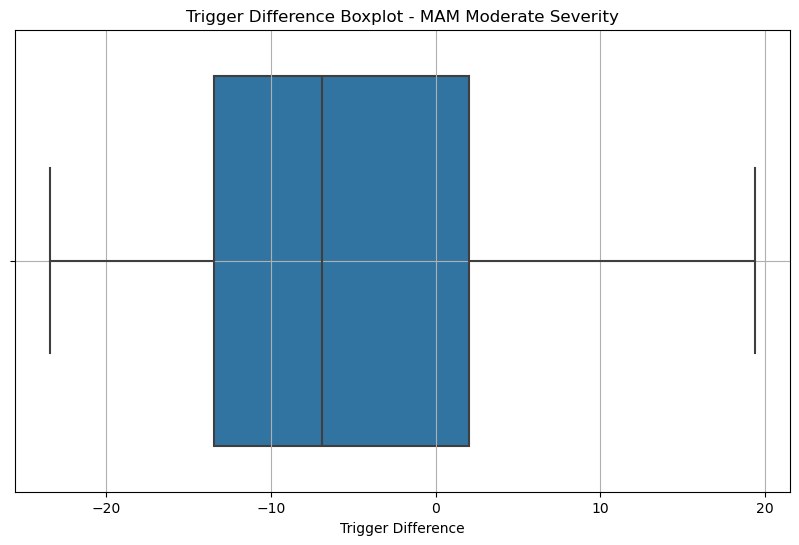

In [43]:
u.plot_trigger_difference_boxplot_admin0(combined_admin0, season = 'MAM', severity = 'Moderate Severity')

### Regional Level

#### Trigger Table

In [44]:
# Display Trigger Table at the National Level based on the Bad Years and Frequency

admin_tables = u.get_trigger_tables(maproom=maproom, mode=1, season=season, predictor=predictor, bad_years = bad_years,
                                              predictand=predictand, year = year, issue_month=issue_month, frequencies=frequencies,
                                              include_upcoming=include_upcoming, threshold_protocol=threshold_protocol,
                                              username=username, password=password,need_valid_keys=need_valid_keys,
                                              valid_keys=valid_keys)

combined_admin1 = pd.concat(admin_tables["admin1_tables"].values(), ignore_index=True)

u.style_and_render_df_with_hyperlinks(combined_admin1)

Fetching....


,Admin Name,Year,Frequency (%),Issue Month,Forecast,Forecast Threshold,Trigger Difference,Forecast Accuracy (%),Triggered,Adjusted Forecast Threshold,Threshold Protocol,Triggered Adjusted,Act in Vain,Fail to Act,Worthy Action,Worthy Inaction,Design Tool URL
0,Djibouti,2019,5%,Feb,17.92,30.26,-12.34,80.00%,False,30.26,0,False,1.0,5.0,0.0,24.0,Design Tool Link
1,Djibouti,2007,5%,Feb,12.81,30.26,-17.45,80.00%,False,30.26,0,False,1.0,5.0,0.0,24.0,Design Tool Link
2,Djibouti,2002,5%,Feb,10.77,30.26,-19.49,80.00%,False,30.26,0,False,1.0,5.0,0.0,24.0,Design Tool Link
3,Djibouti,2000,5%,Feb,28.15,30.26,-2.12,80.00%,False,30.26,0,False,1.0,5.0,0.0,24.0,Design Tool Link
4,Djibouti,1999,5%,Feb,30.26,30.26,0.00,80.00%,False,30.26,0,False,1.0,5.0,0.0,24.0,Design Tool Link
5,Djibouti,1994,5%,Feb,14.88,30.26,-15.38,80.00%,False,30.26,0,False,1.0,5.0,0.0,24.0,Design Tool Link
6,Djibouti,1991,5%,Feb,8.94,30.26,-21.32,80.00%,False,30.26,0,False,1.0,5.0,0.0,24.0,Design Tool Link
7,Ali Sabieh,2019,5%,Feb,18.72,32.52,-13.80,80.00%,False,32.52,0,False,1.0,5.0,0.0,24.0,Design Tool Link
8,Ali Sabieh,2007,5%,Feb,14.21,32.52,-18.31,80.00%,False,32.52,0,False,1.0,5.0,0.0,24.0,Design Tool Link
9,Ali Sabieh,2002,5%,Feb,12.77,32.52,-19.75,80.00%,False,32.52,0,False,1.0,5.0,0.0,24.0,Design Tool Link


In [45]:
# Filter for non - triggered events
non_triggered_events = combined_admin1[~combined_admin1['Triggered']]['Year'].unique()
print(non_triggered_events)

[2019 2007 2002 2000 1999 1994 1991]


#### Triggered Bad Years by Frequency and Issue Month

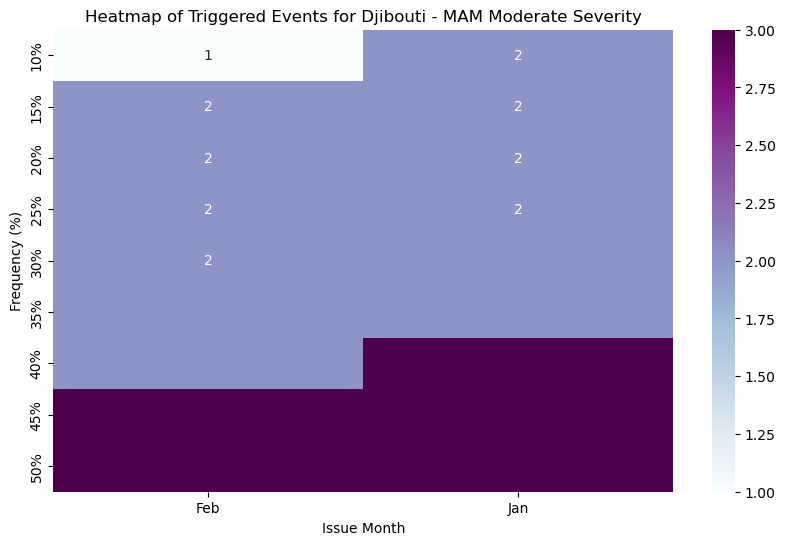

<Figure size 640x480 with 0 Axes>

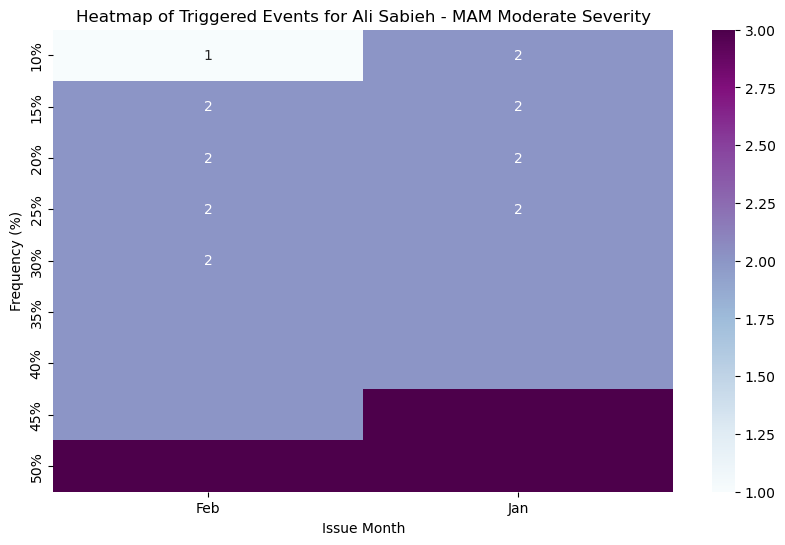

<Figure size 640x480 with 0 Axes>

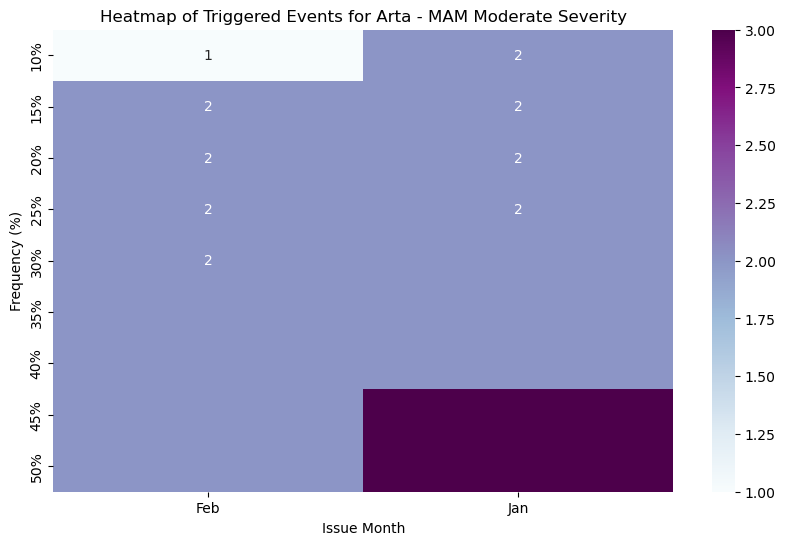

<Figure size 640x480 with 0 Axes>

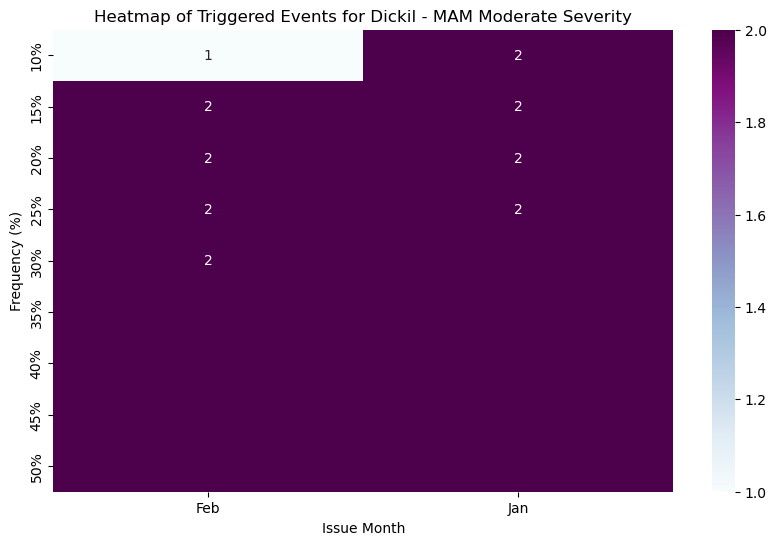

<Figure size 640x480 with 0 Axes>

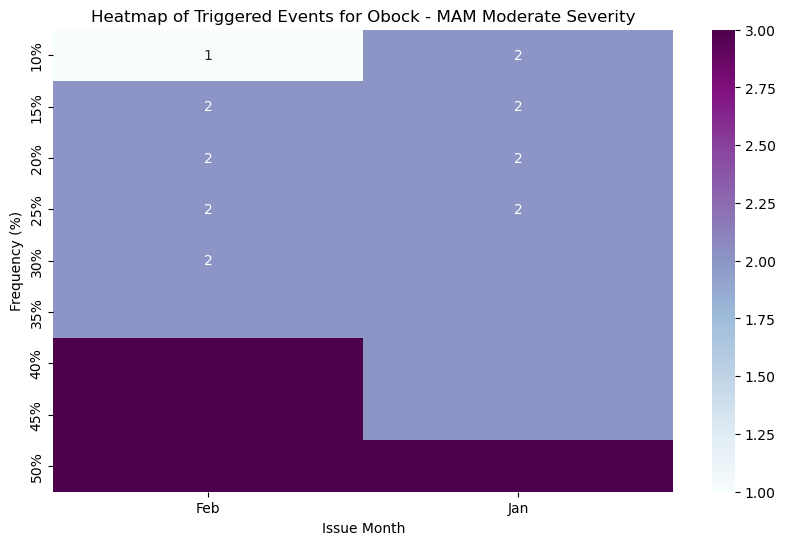

<Figure size 640x480 with 0 Axes>

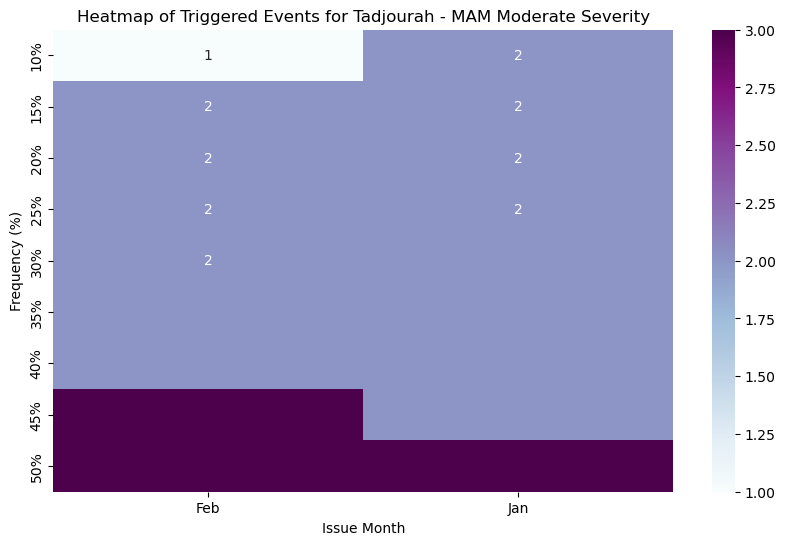

<Figure size 640x480 with 0 Axes>

In [46]:
u.generate_heatmaps_for_admin1(combined_admin1, season = 'MAM', severity = 'Moderate Severity')

#### Threshold Protocol Analysis Using Trigger Differences

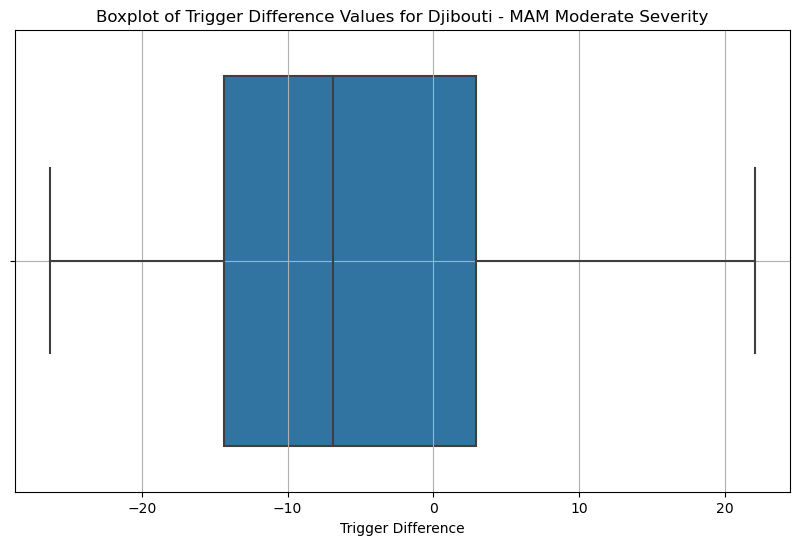

Quantile Ranges for Djibouti:
{0.0: -26.31021567432099, 0.25: -14.352887593393037, 0.5: -6.861401476767266, 0.75: 2.9637399634089885, 1.0: 22.059669684838454}




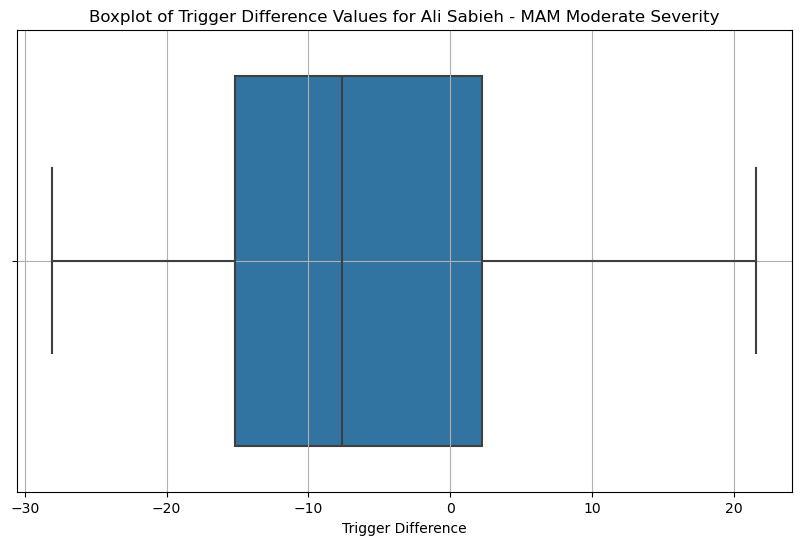

Quantile Ranges for Ali Sabieh:
{0.0: -28.07964680227719, 0.25: -15.165862688295864, 0.5: -7.618081012659273, 0.75: 2.248475368832292, 1.0: 21.573909405096693}




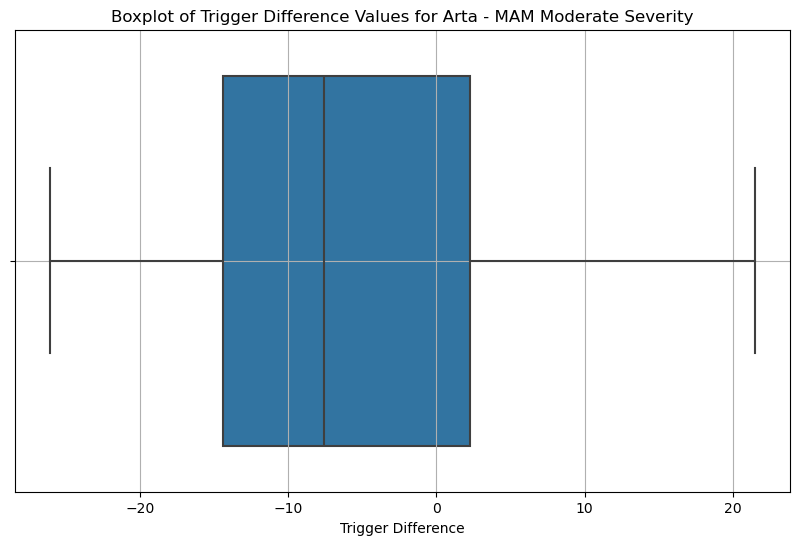

Quantile Ranges for Arta:
{0.0: -26.080561245746743, 0.25: -14.388549086634152, 0.5: -7.556703254643752, 0.75: 2.2877718755253182, 1.0: 21.4801857887324}




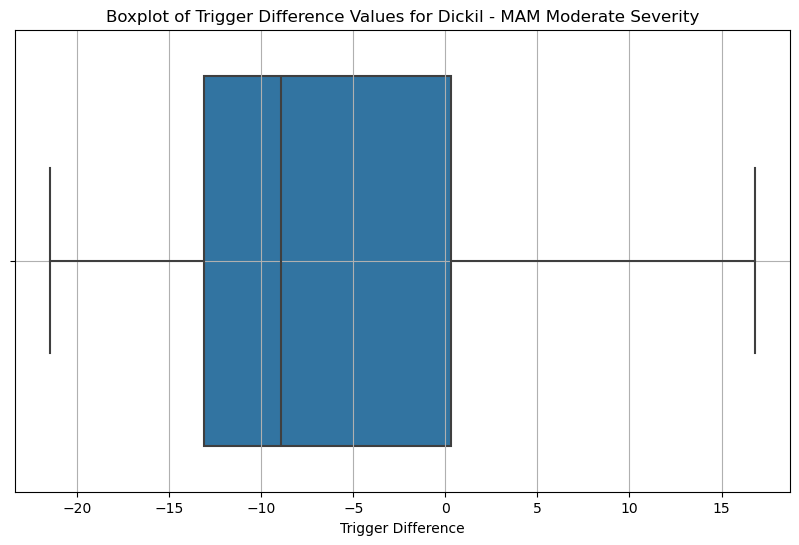

Quantile Ranges for Dickil:
{0.0: -21.484522831083552, 0.25: -13.135620197691187, 0.5: -8.92510720885261, 0.75: 0.2965574443487329, 1.0: 16.79986008973689}




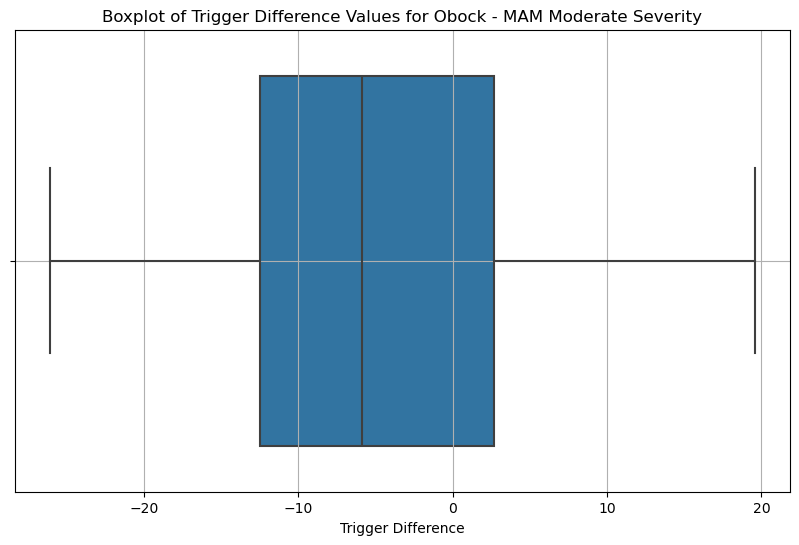

Quantile Ranges for Obock:
{0.0: -26.078682494472176, 0.25: -12.459082895665787, 0.5: -5.881671897009914, 0.75: 2.664879201467439, 1.0: 19.555504108519337}




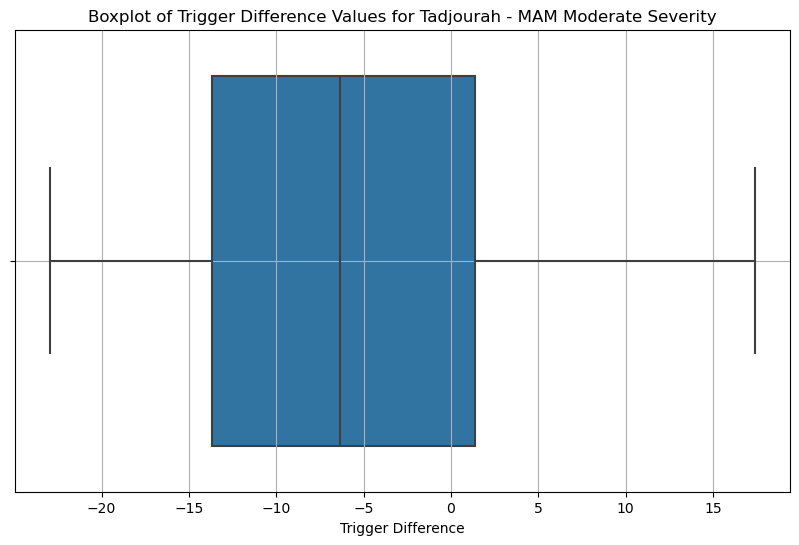

Quantile Ranges for Tadjourah:
{0.0: -22.943122438432543, 0.25: -13.66628113418057, 0.5: -6.320166845758717, 0.75: 1.364524768918013, 1.0: 17.38929187894918}




In [47]:
u.plot_boxplots_and_quantiles_admin1(combined_admin1, season = 'MAM', severity = 'Moderate Severity')

# OND Season

In [48]:
# Loading Country Variables

maproom = "djibouti-ond"

config = u.load_config()

# Accessing values for the specified maproom

country_config = config.get("maprooms", {}).get(maproom, {})

# Access individual values using the 'maproom' variable

country = country_config.get("country")
modes = country_config.get("mode", [])
year = country_config.get("year")
season = country_config.get("season")
target_season = country_config.get("target_season")
issue_month = country_config['issue_month']
predictor = country_config['predictor']
predictand = country_config['predictand']
include_upcoming = country_config['include_upcoming']
design_tool = country_config['design_tool']
report = country_config['report']
username = country_config['username']
password = country_config['password']
threshold_protocol = country_config['threshold_protocol']
need_valid_keys = country_config['need_valid_keys']
valid_keys = country_config['admin1_list']

## High Severity

In [49]:
# Bad Years collected during the stakeholder workshop

bad_years = [1983, 1985, 1987, 1991, 1995, 2005, 2010, 2012, 2021]

# Range of Frequencies

frequencies = list(range(5, 51, 5))

### National Level

#### Trigger Table

In [50]:
# Display Trigger Table at the National Level based on the Bad Years and Frequency

admin_tables = u.get_trigger_tables(maproom=maproom, mode=0, season=season, predictor=predictor, bad_years = bad_years,
                                              predictand=predictand, year = year, issue_month=issue_month, frequencies=frequencies,
                                              include_upcoming=include_upcoming, threshold_protocol=threshold_protocol,
                                              username=username, password=password,need_valid_keys=need_valid_keys,
                                              valid_keys=valid_keys)

combined_admin0 = pd.concat(admin_tables["admin0_tables"].values(), ignore_index=True)

u.style_and_render_df_with_hyperlinks(combined_admin0)

Fetching....


,Admin Name,Year,Frequency (%),Issue Month,Forecast,Forecast Threshold,Trigger Difference,Forecast Accuracy (%),Triggered,Adjusted Forecast Threshold,Threshold Protocol,Triggered Adjusted,Act in Vain,Fail to Act,Worthy Action,Worthy Inaction,Design Tool URL
0,Djibouti,2021,5%,Sep,24.19,33.94,-9.75,77.42%,False,33.94,0,False,1.0,6.0,0.0,24.0,Design Tool Link
1,Djibouti,2012,5%,Sep,12.49,33.94,-21.45,77.42%,False,33.94,0,False,1.0,6.0,0.0,24.0,Design Tool Link
2,Djibouti,2010,5%,Sep,23.58,33.94,-10.36,77.42%,False,33.94,0,False,1.0,6.0,0.0,24.0,Design Tool Link
3,Djibouti,2005,5%,Sep,22.05,33.94,-11.89,77.42%,False,33.94,0,False,1.0,6.0,0.0,24.0,Design Tool Link
4,Djibouti,1995,5%,Sep,21.53,33.94,-12.41,77.42%,False,33.94,0,False,1.0,6.0,0.0,24.0,Design Tool Link
5,Djibouti,1991,5%,Sep,20.23,33.94,-13.71,77.42%,False,33.94,0,False,1.0,6.0,0.0,24.0,Design Tool Link
6,Djibouti,2021,10%,Sep,27.05,30.38,-3.33,70.97%,False,30.38,0,False,3.0,6.0,0.0,22.0,Design Tool Link
7,Djibouti,2012,10%,Sep,14.44,30.38,-15.94,70.97%,False,30.38,0,False,3.0,6.0,0.0,22.0,Design Tool Link
8,Djibouti,2010,10%,Sep,26.31,30.38,-4.07,70.97%,False,30.38,0,False,3.0,6.0,0.0,22.0,Design Tool Link
9,Djibouti,2005,10%,Sep,24.89,30.38,-5.49,70.97%,False,30.38,0,False,3.0,6.0,0.0,22.0,Design Tool Link


In [51]:
# Filter for non - triggered events
non_triggered_events = combined_admin0[~combined_admin0['Triggered']]['Year'].unique()
print(non_triggered_events)

[2021 2012 2010 2005 1995 1991]


#### Triggered Bad Years by Frequency and Issue Month

In [52]:
# Filter the data for triggered bad years and then summarize the counts by frequency and issue month.

# Filter for triggered bad years
triggered_events = combined_admin0[combined_admin0['Triggered']]

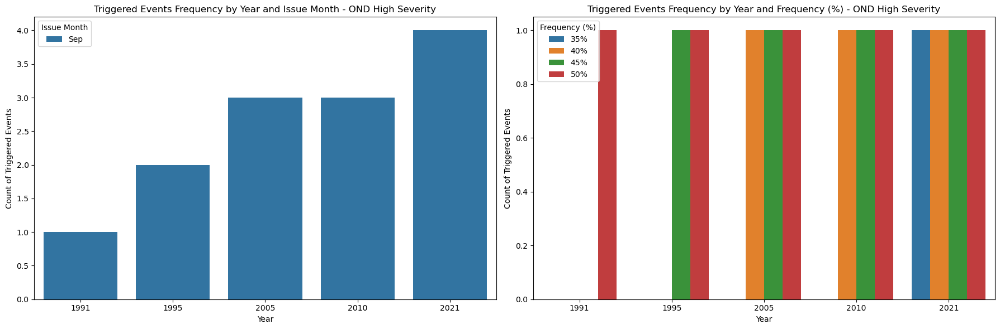

In [53]:
u.plot_triggered_events_admin0(triggered_events, season = 'OND', severity = 'High Severity')

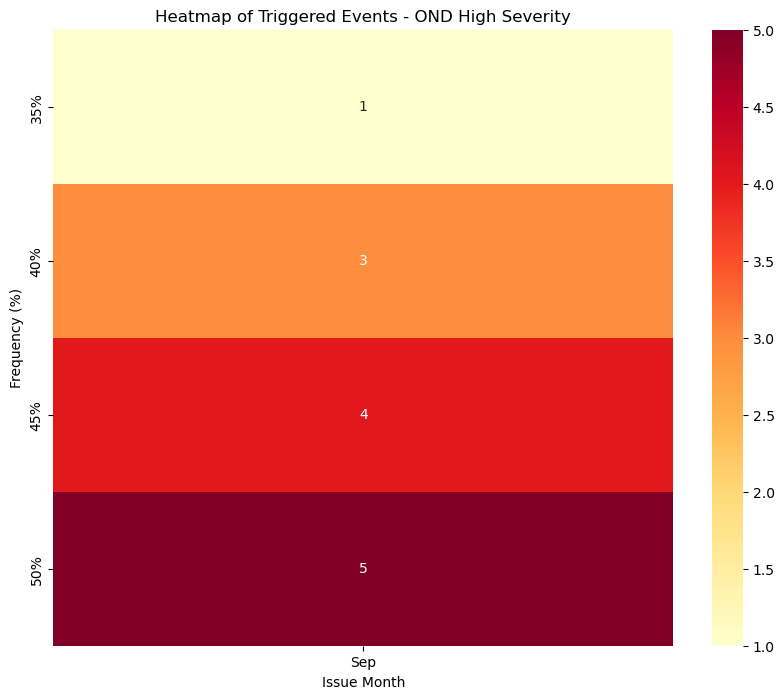

<Figure size 640x480 with 0 Axes>

In [54]:
u.plot_triggered_events_heatmap_admin0(triggered_events, season = 'OND', severity = 'High Severity')

#### Threshold Protocol Analysis Using Trigger Differences

Quantile Ranges for Trigger Difference - OND High Severity {0.0: -21.454090867856486, 0.25: -7.986481403303977, 0.5: -3.386846604470948, 0.75: -0.5042502032258742, 1.0: 5.135208633489498}
{0.0: -21.454090867856486, 0.25: -7.986481403303977, 0.5: -3.386846604470948, 0.75: -0.5042502032258742, 1.0: 5.135208633489498}




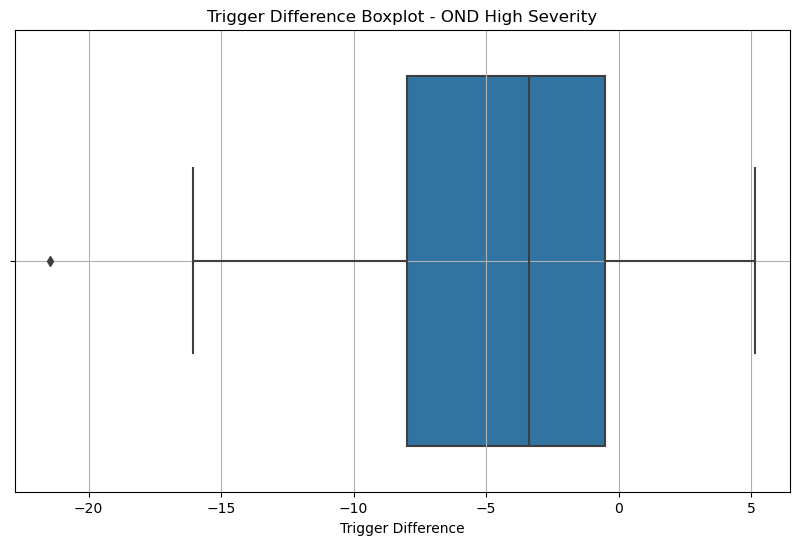

In [55]:
u.plot_trigger_difference_boxplot_admin0(combined_admin0, season = 'OND', severity = 'High Severity')

### Regional Level

#### Trigger Table

In [56]:
# Display Trigger Table at the National Level based on the Bad Years and Frequency

admin_tables = u.get_trigger_tables(maproom=maproom, mode=1, season=season, predictor=predictor, bad_years = bad_years,
                                              predictand=predictand, year = year, issue_month=issue_month, frequencies=frequencies,
                                              include_upcoming=include_upcoming, threshold_protocol=threshold_protocol,
                                              username=username, password=password,need_valid_keys=need_valid_keys,
                                              valid_keys=valid_keys)

combined_admin1 = pd.concat(admin_tables["admin1_tables"].values(), ignore_index=True)

u.style_and_render_df_with_hyperlinks(combined_admin1)

Fetching....


,Admin Name,Year,Frequency (%),Issue Month,Forecast,Forecast Threshold,Trigger Difference,Forecast Accuracy (%),Triggered,Adjusted Forecast Threshold,Threshold Protocol,Triggered Adjusted,Act in Vain,Fail to Act,Worthy Action,Worthy Inaction,Design Tool URL
0,Djibouti,2021,5%,Sep,35.88,42.75,-6.87,77.42%,False,42.75,0,False,1.0,6.0,0.0,24.0,Design Tool Link
1,Djibouti,2012,5%,Sep,13.91,42.75,-28.84,77.42%,False,42.75,0,False,1.0,6.0,0.0,24.0,Design Tool Link
2,Djibouti,2010,5%,Sep,36.74,42.75,-6.00,77.42%,False,42.75,0,False,1.0,6.0,0.0,24.0,Design Tool Link
3,Djibouti,2005,5%,Sep,28.09,42.75,-14.66,77.42%,False,42.75,0,False,1.0,6.0,0.0,24.0,Design Tool Link
4,Djibouti,1995,5%,Sep,27.60,42.75,-15.15,77.42%,False,42.75,0,False,1.0,6.0,0.0,24.0,Design Tool Link
5,Djibouti,1991,5%,Sep,23.23,42.75,-19.52,77.42%,False,42.75,0,False,1.0,6.0,0.0,24.0,Design Tool Link
6,Ali Sabieh,2021,5%,Sep,28.80,39.28,-10.48,77.42%,False,39.28,0,False,1.0,6.0,0.0,24.0,Design Tool Link
7,Ali Sabieh,2012,5%,Sep,13.24,39.28,-26.04,77.42%,False,39.28,0,False,1.0,6.0,0.0,24.0,Design Tool Link
8,Ali Sabieh,2010,5%,Sep,28.32,39.28,-10.96,77.42%,False,39.28,0,False,1.0,6.0,0.0,24.0,Design Tool Link
9,Ali Sabieh,2005,5%,Sep,24.79,39.28,-14.49,77.42%,False,39.28,0,False,1.0,6.0,0.0,24.0,Design Tool Link


In [57]:
# Filter for non - triggered events
non_triggered_events = combined_admin1[~combined_admin1['Triggered']]['Year'].unique()
print(non_triggered_events)

[2021 2012 2010 2005 1995 1991]


#### Triggered Bad Years by Frequency and Issue Month

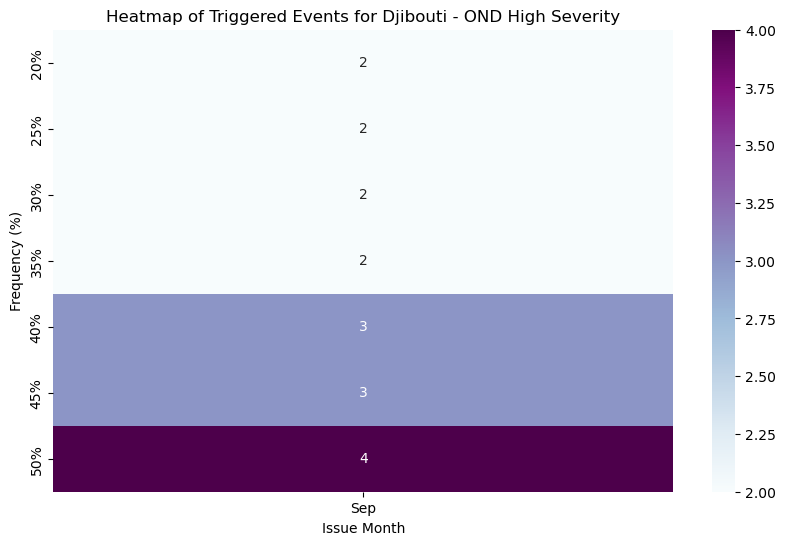

<Figure size 640x480 with 0 Axes>

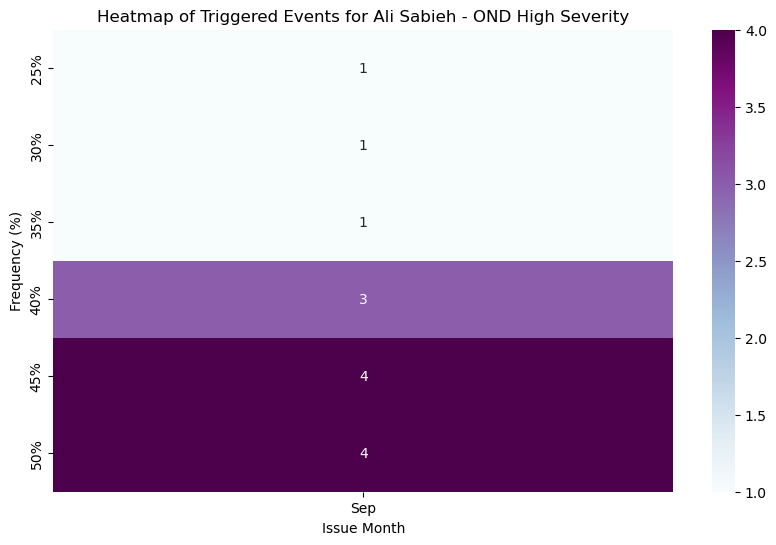

<Figure size 640x480 with 0 Axes>

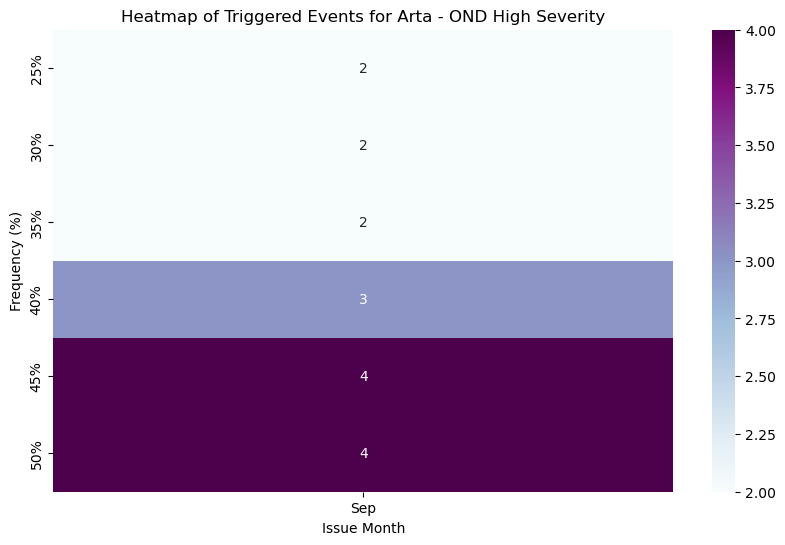

<Figure size 640x480 with 0 Axes>

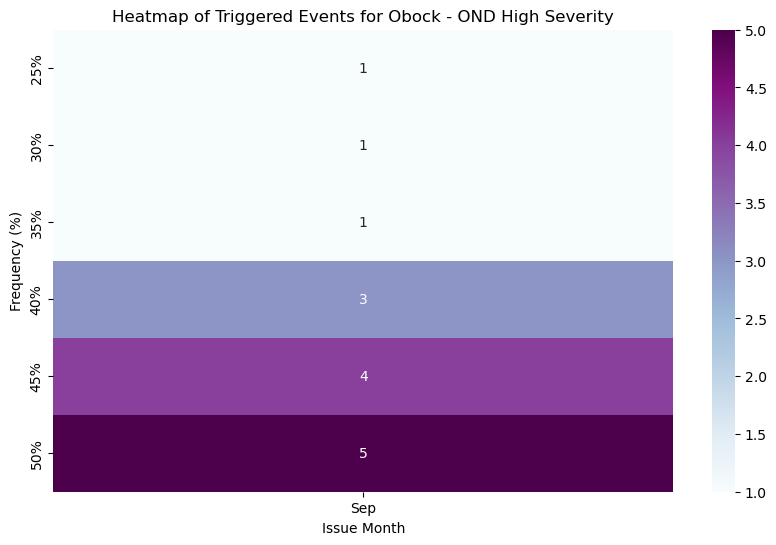

<Figure size 640x480 with 0 Axes>

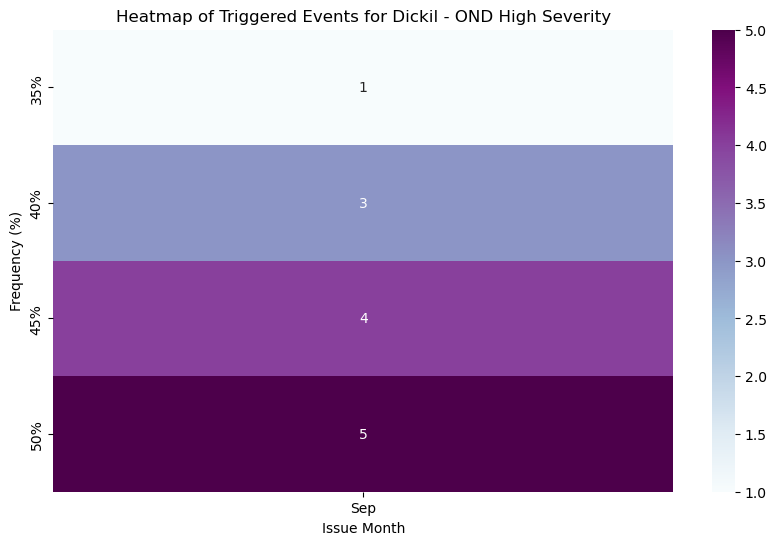

<Figure size 640x480 with 0 Axes>

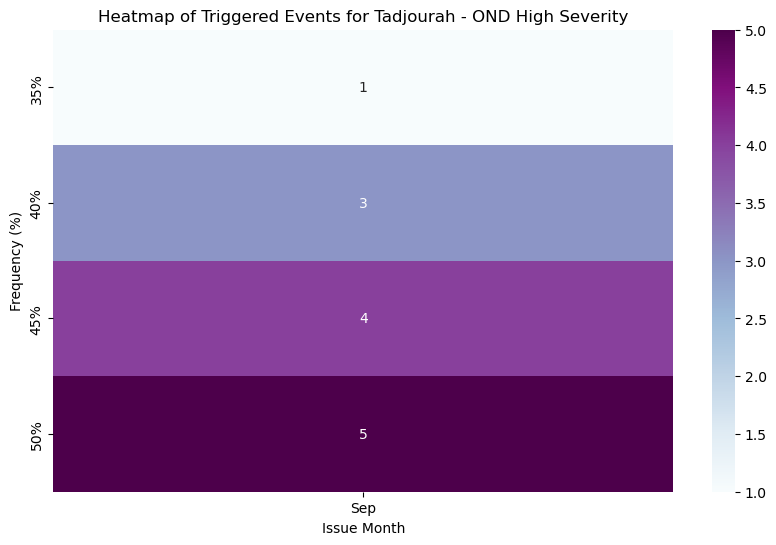

<Figure size 640x480 with 0 Axes>

In [58]:
u.generate_heatmaps_for_admin1(combined_admin1, season = 'OND', severity = 'High Severity')

#### Threshold Protocol Analysis Using Trigger Differences

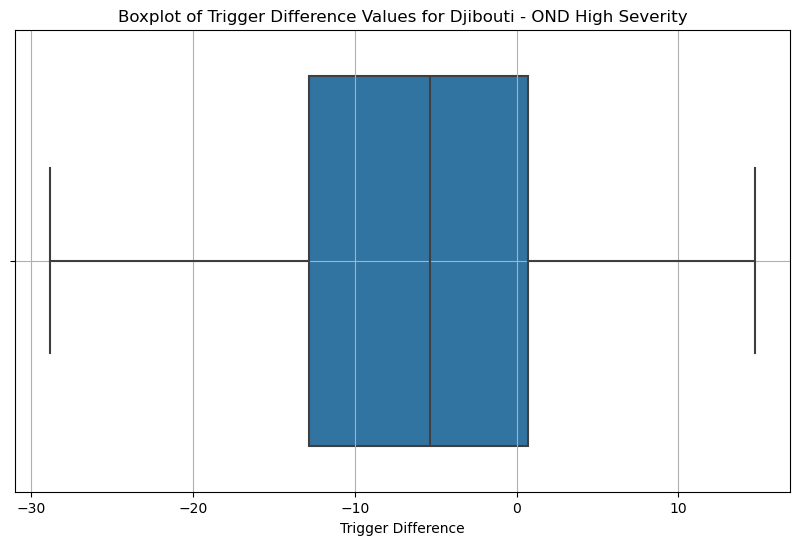

Quantile Ranges for Djibouti:
{0.0: -28.837196653126696, 0.25: -12.858365311702222, 0.5: -5.324945712256813, 0.75: 0.695536179089256, 1.0: 14.719345725605699}




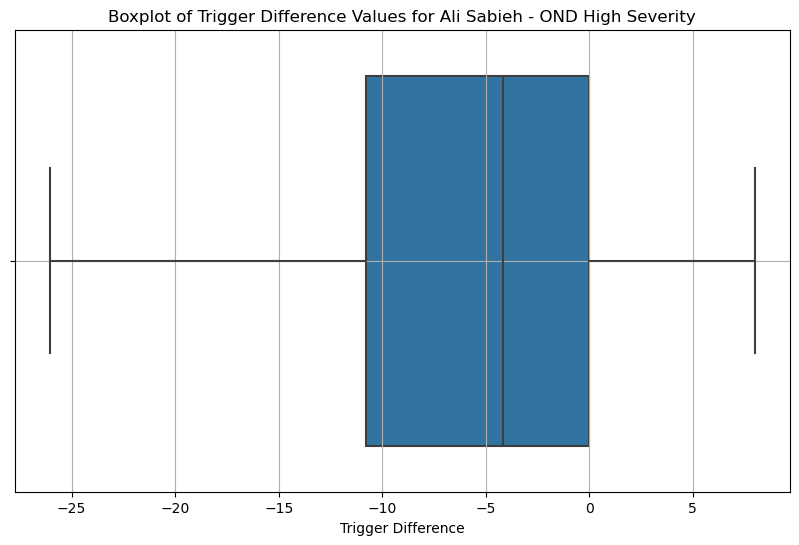

Quantile Ranges for Ali Sabieh:
{0.0: -26.039156302648262, 0.25: -10.807318781825792, 0.5: -4.1464404232491106, 0.75: 0.0, 1.0: 7.983134034752133}




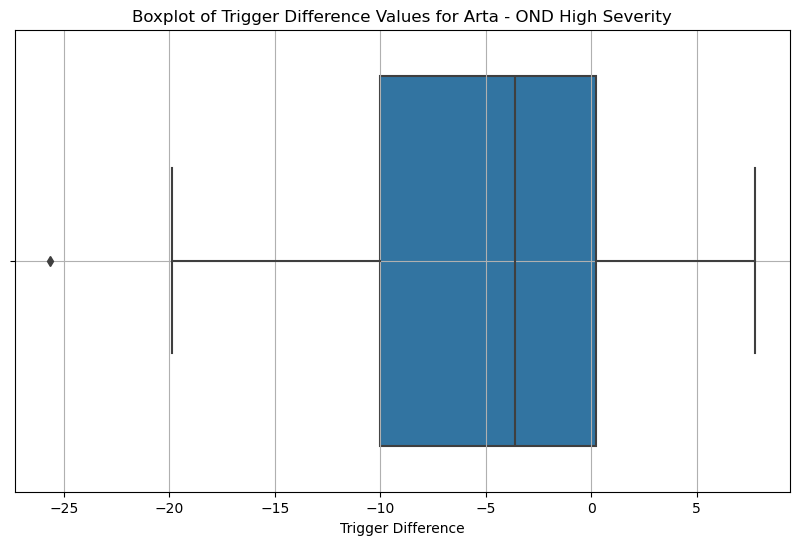

Quantile Ranges for Arta:
{0.0: -25.65723113075765, 0.25: -10.006104422208903, 0.5: -3.630730663904, 0.75: 0.2153763899742014, 1.0: 7.744162425728383}




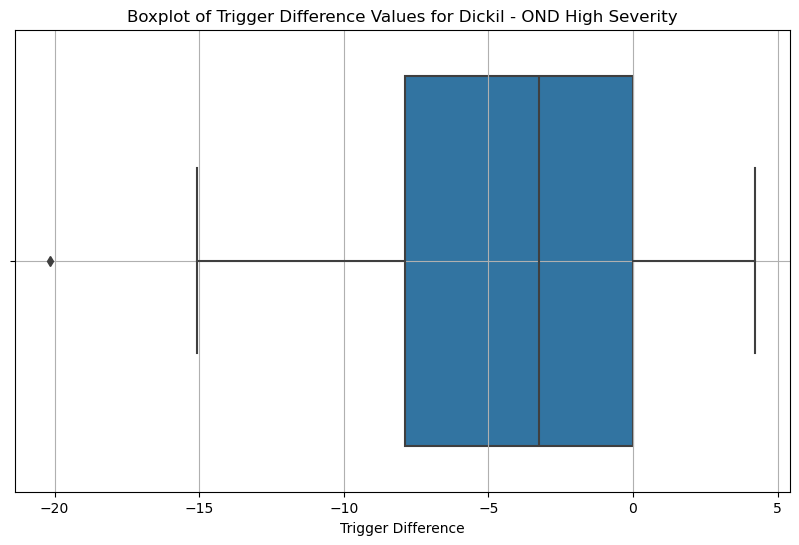

Quantile Ranges for Dickil:
{0.0: -20.153225585948917, 0.25: -7.895945416211936, 0.5: -3.2590680845555973, 0.75: 0.0, 1.0: 4.204423966284978}




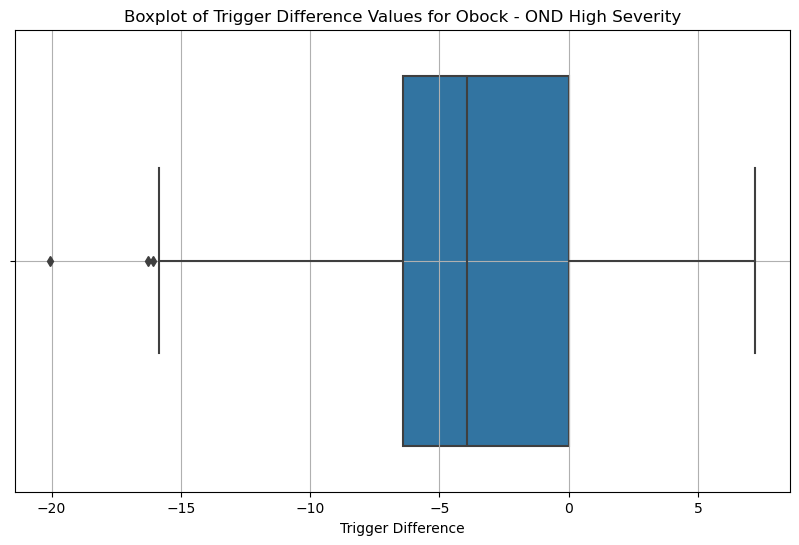

Quantile Ranges for Obock:
{0.0: -20.056907303541674, 0.25: -6.41312685460465, 0.5: -3.9304219094873503, 0.75: 0.014809519295765128, 1.0: 7.191988015479971}




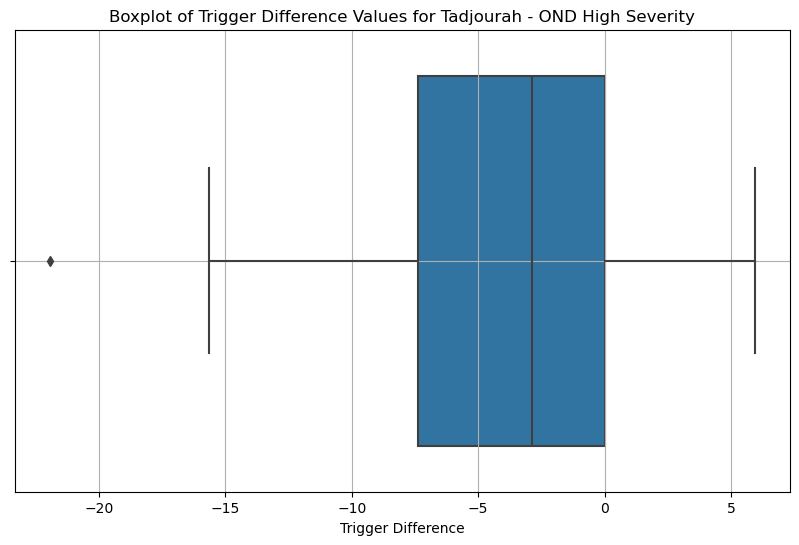

Quantile Ranges for Tadjourah:
{0.0: -21.93244917690805, 0.25: -7.372578680909271, 0.5: -2.8559780935036176, 0.75: 0.0, 1.0: 5.93135685984052}




In [59]:
u.plot_boxplots_and_quantiles_admin1(combined_admin1, season = 'OND', severity = 'High Severity')

## Moderate Severity

In [60]:
# Bad Years collected during the stakeholder workshop

bad_years = [1981, 1984, 1990, 2003, 2007, 2010, 2011, 2017]

# Range of Frequencies

frequencies = list(range(5, 51, 5))

### National Level

#### Trigger Table

In [61]:
# Display Trigger Table at the National Level based on the Bad Years and Frequency

admin_tables = u.get_trigger_tables(maproom=maproom, mode=0, season=season, predictor=predictor, bad_years = bad_years,
                                              predictand=predictand, year = year, issue_month=issue_month, frequencies=frequencies,
                                              include_upcoming=include_upcoming, threshold_protocol=threshold_protocol,
                                              username=username, password=password,need_valid_keys=need_valid_keys,
                                              valid_keys=valid_keys)

combined_admin0 = pd.concat(admin_tables["admin0_tables"].values(), ignore_index=True)

u.style_and_render_df_with_hyperlinks(combined_admin0)

Fetching....


,Admin Name,Year,Frequency (%),Issue Month,Forecast,Forecast Threshold,Trigger Difference,Forecast Accuracy (%),Triggered,Adjusted Forecast Threshold,Threshold Protocol,Triggered Adjusted,Act in Vain,Fail to Act,Worthy Action,Worthy Inaction,Design Tool URL
0,Djibouti,2017,5%,Sep,16.94,33.94,-17.00,77.42%,False,33.94,0,False,1.0,6.0,0.0,24.0,Design Tool Link
1,Djibouti,2011,5%,Sep,10.72,33.94,-23.22,77.42%,False,33.94,0,False,1.0,6.0,0.0,24.0,Design Tool Link
2,Djibouti,2010,5%,Sep,23.58,33.94,-10.36,77.42%,False,33.94,0,False,1.0,6.0,0.0,24.0,Design Tool Link
3,Djibouti,2007,5%,Sep,14.89,33.94,-19.05,77.42%,False,33.94,0,False,1.0,6.0,0.0,24.0,Design Tool Link
4,Djibouti,2003,5%,Sep,15.22,33.94,-18.72,77.42%,False,33.94,0,False,1.0,6.0,0.0,24.0,Design Tool Link
5,Djibouti,2017,10%,Sep,19.40,30.38,-10.99,70.97%,False,30.38,0,False,3.0,6.0,0.0,22.0,Design Tool Link
6,Djibouti,2011,10%,Sep,12.46,30.38,-17.92,70.97%,False,30.38,0,False,3.0,6.0,0.0,22.0,Design Tool Link
7,Djibouti,2010,10%,Sep,26.31,30.38,-4.07,70.97%,False,30.38,0,False,3.0,6.0,0.0,22.0,Design Tool Link
8,Djibouti,2007,10%,Sep,17.06,30.38,-13.32,70.97%,False,30.38,0,False,3.0,6.0,0.0,22.0,Design Tool Link
9,Djibouti,2003,10%,Sep,17.44,30.38,-12.94,70.97%,False,30.38,0,False,3.0,6.0,0.0,22.0,Design Tool Link


In [62]:
# Filter for non - triggered events
non_triggered_events = combined_admin0[~combined_admin0['Triggered']]['Year'].unique()
print(non_triggered_events)

[2017 2011 2010 2007 2003]


#### Triggered Bad Years by Frequency and Issue Month

In [63]:
# Filter the data for triggered bad years and then summarize the counts by frequency and issue month.

# Filter for triggered bad years
triggered_events = combined_admin0[combined_admin0['Triggered']]

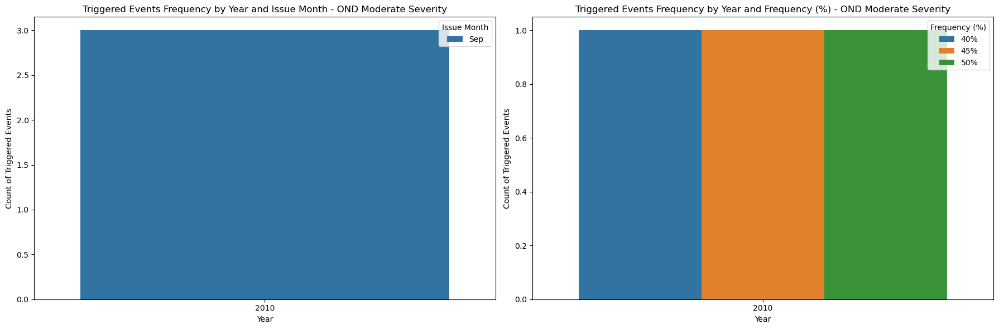

In [64]:
u.plot_triggered_events_admin0(triggered_events, season = 'OND', severity = 'Moderate Severity')

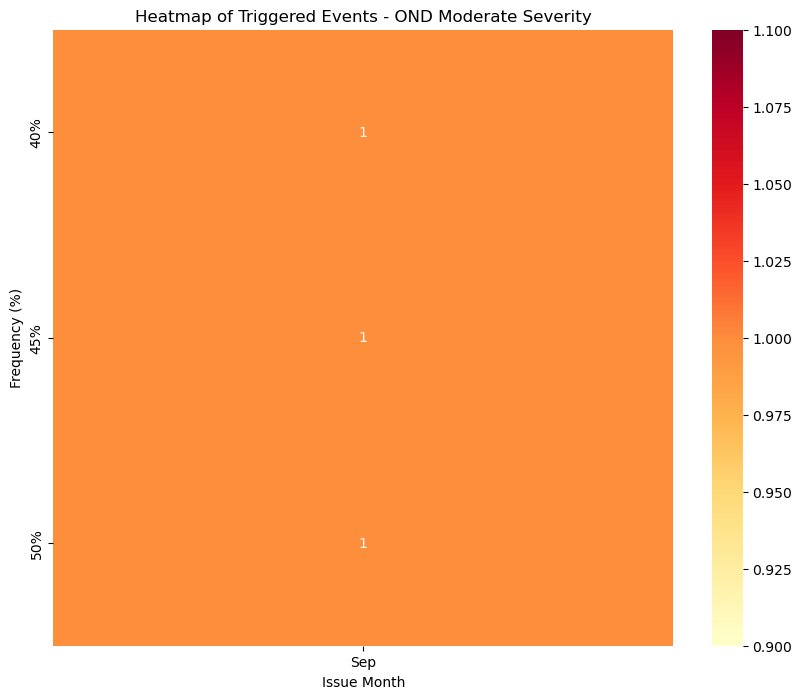

<Figure size 640x480 with 0 Axes>

In [65]:
u.plot_triggered_events_heatmap_admin0(triggered_events, season = 'OND', severity = 'Moderate Severity')

#### Threshold Protocol Analysis Using Trigger Differences

Quantile Ranges for Trigger Difference - OND Moderate Severity {0.0: -23.22141345779289, 0.25: -14.249162354028162, 0.5: -10.690815103919578, 0.75: -7.363890338758955, 1.0: 3.566372295227964}
{0.0: -23.22141345779289, 0.25: -14.249162354028162, 0.5: -10.690815103919578, 0.75: -7.363890338758955, 1.0: 3.566372295227964}




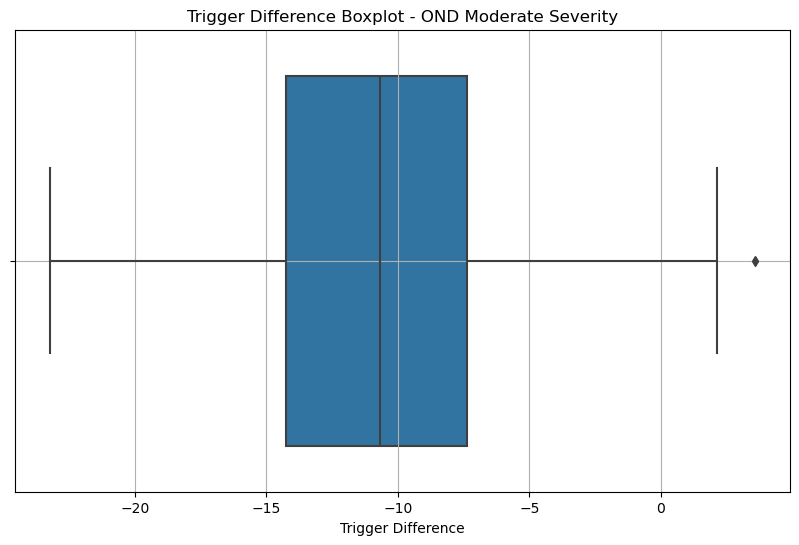

In [66]:
u.plot_trigger_difference_boxplot_admin0(combined_admin0, season = 'OND', severity = 'Moderate Severity')

### Regional Level

#### Trigger Table

In [67]:
# Display Trigger Table at the National Level based on the Bad Years and Frequency

admin_tables = u.get_trigger_tables(maproom=maproom, mode=1, season=season, predictor=predictor, bad_years = bad_years,
                                              predictand=predictand, year = year, issue_month=issue_month, frequencies=frequencies,
                                              include_upcoming=include_upcoming, threshold_protocol=threshold_protocol,
                                              username=username, password=password,need_valid_keys=need_valid_keys,
                                              valid_keys=valid_keys)

combined_admin1 = pd.concat(admin_tables["admin1_tables"].values(), ignore_index=True)

u.style_and_render_df_with_hyperlinks(combined_admin1)

Fetching....


,Admin Name,Year,Frequency (%),Issue Month,Forecast,Forecast Threshold,Trigger Difference,Forecast Accuracy (%),Triggered,Adjusted Forecast Threshold,Threshold Protocol,Triggered Adjusted,Act in Vain,Fail to Act,Worthy Action,Worthy Inaction,Design Tool URL
0,Djibouti,2017,5%,Sep,19.41,42.75,-23.34,77.42%,False,42.75,0,False,1.0,6.0,0.0,24.0,Design Tool Link
1,Djibouti,2011,5%,Sep,14.26,42.75,-28.49,77.42%,False,42.75,0,False,1.0,6.0,0.0,24.0,Design Tool Link
2,Djibouti,2010,5%,Sep,36.74,42.75,-6.00,77.42%,False,42.75,0,False,1.0,6.0,0.0,24.0,Design Tool Link
3,Djibouti,2007,5%,Sep,20.71,42.75,-22.04,77.42%,False,42.75,0,False,1.0,6.0,0.0,24.0,Design Tool Link
4,Djibouti,2003,5%,Sep,17.25,42.75,-25.50,77.42%,False,42.75,0,False,1.0,6.0,0.0,24.0,Design Tool Link
5,Ali Sabieh,2017,5%,Sep,18.00,39.28,-21.28,77.42%,False,39.28,0,False,1.0,6.0,0.0,24.0,Design Tool Link
6,Ali Sabieh,2011,5%,Sep,11.97,39.28,-27.31,77.42%,False,39.28,0,False,1.0,6.0,0.0,24.0,Design Tool Link
7,Ali Sabieh,2010,5%,Sep,28.32,39.28,-10.96,77.42%,False,39.28,0,False,1.0,6.0,0.0,24.0,Design Tool Link
8,Ali Sabieh,2007,5%,Sep,17.28,39.28,-22.00,77.42%,False,39.28,0,False,1.0,6.0,0.0,24.0,Design Tool Link
9,Ali Sabieh,2003,5%,Sep,16.21,39.28,-23.07,77.42%,False,39.28,0,False,1.0,6.0,0.0,24.0,Design Tool Link


In [68]:
# Filter for non - triggered events
non_triggered_events = combined_admin1[~combined_admin1['Triggered']]['Year'].unique()
print(non_triggered_events)

[2017 2011 2010 2007 2003]


#### Triggered Bad Years by Frequency and Issue Month

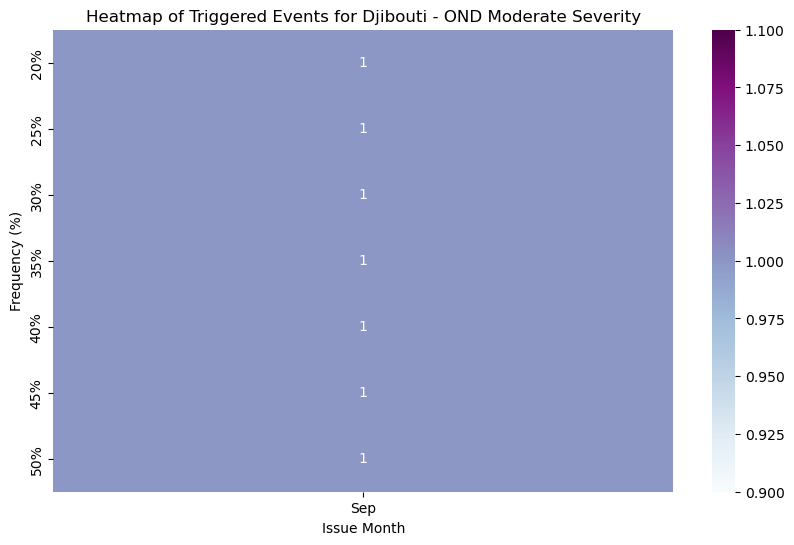

<Figure size 640x480 with 0 Axes>

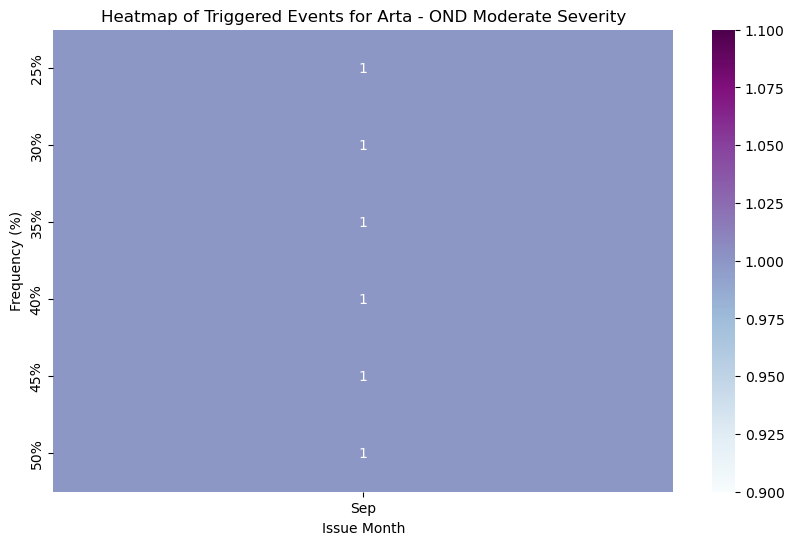

<Figure size 640x480 with 0 Axes>

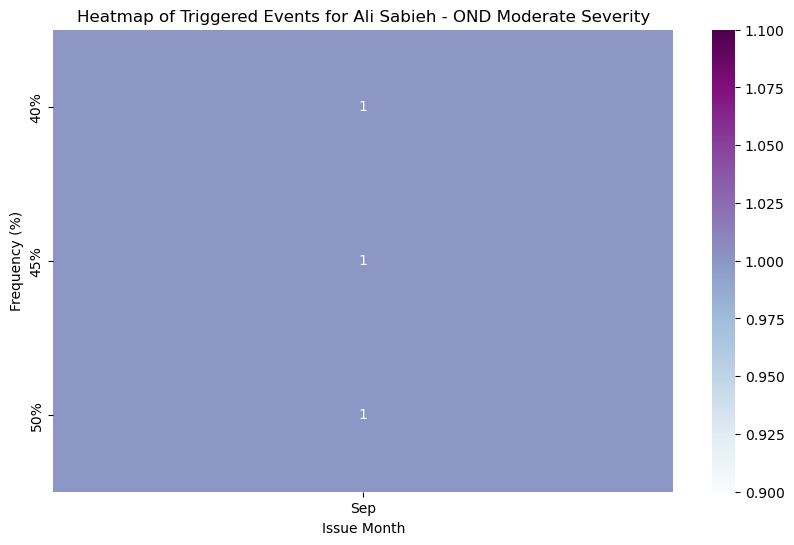

<Figure size 640x480 with 0 Axes>

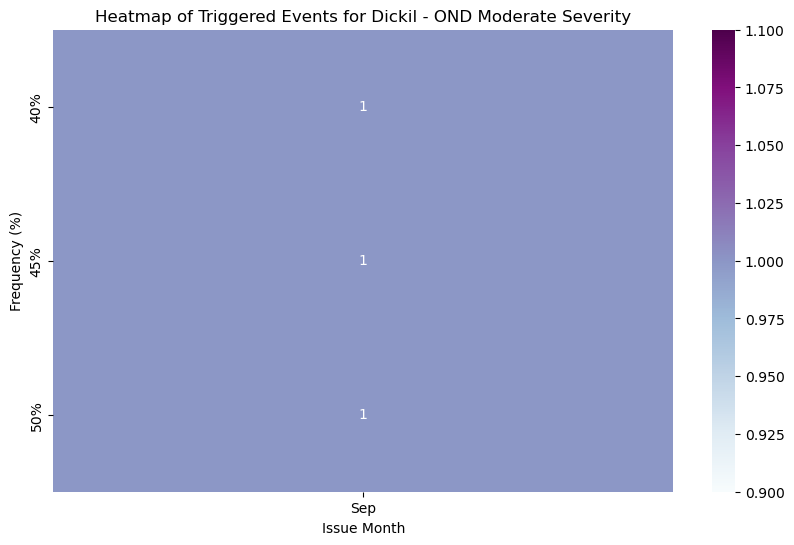

<Figure size 640x480 with 0 Axes>

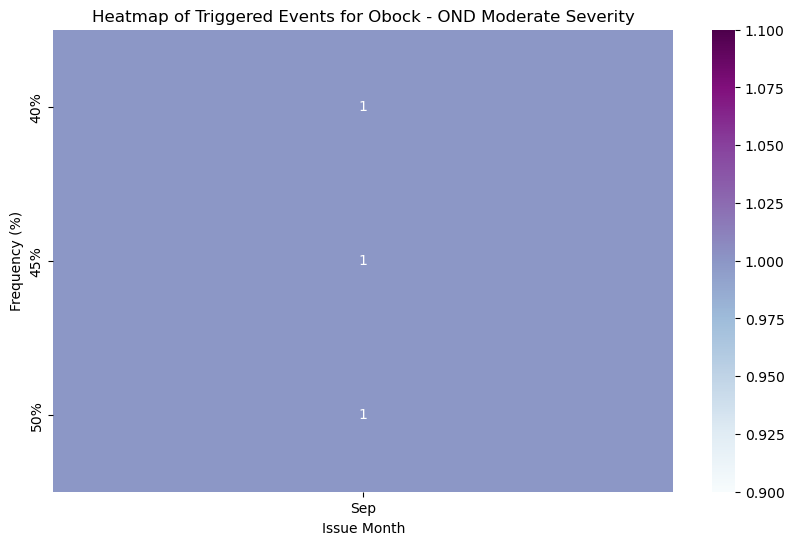

<Figure size 640x480 with 0 Axes>

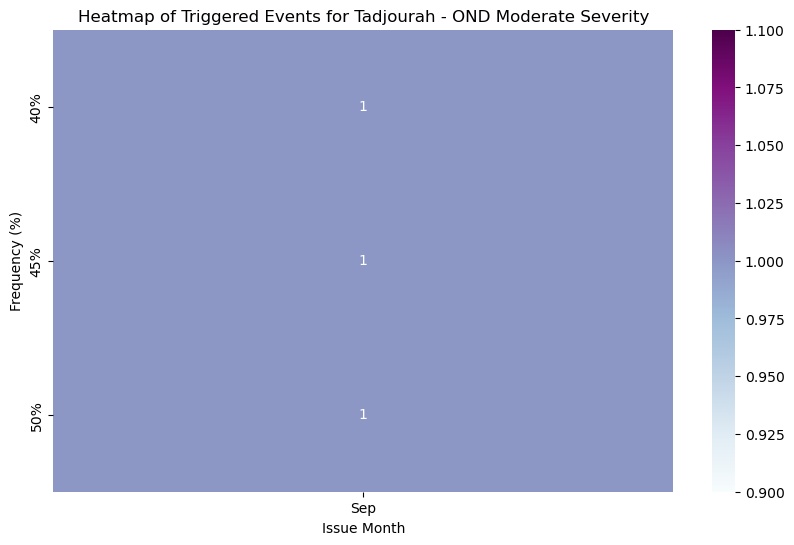

<Figure size 640x480 with 0 Axes>

In [69]:
u.generate_heatmaps_for_admin1(combined_admin1, season = 'OND', severity = 'Moderate Severity')

#### Threshold Protocol Analysis Using Trigger Differences

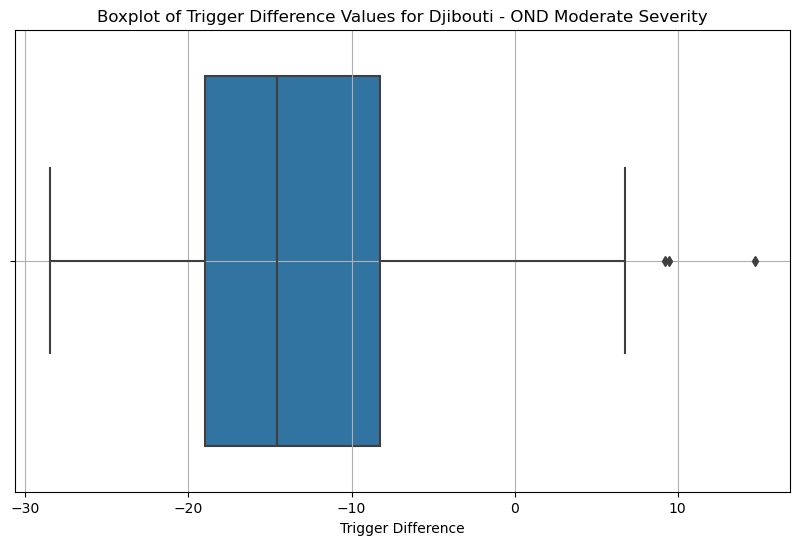

Quantile Ranges for Djibouti:
{0.0: -28.486945551775516, 0.25: -18.96993120774564, 0.5: -14.581654027483873, 0.75: -8.269198602048142, 1.0: 14.719345725605699}




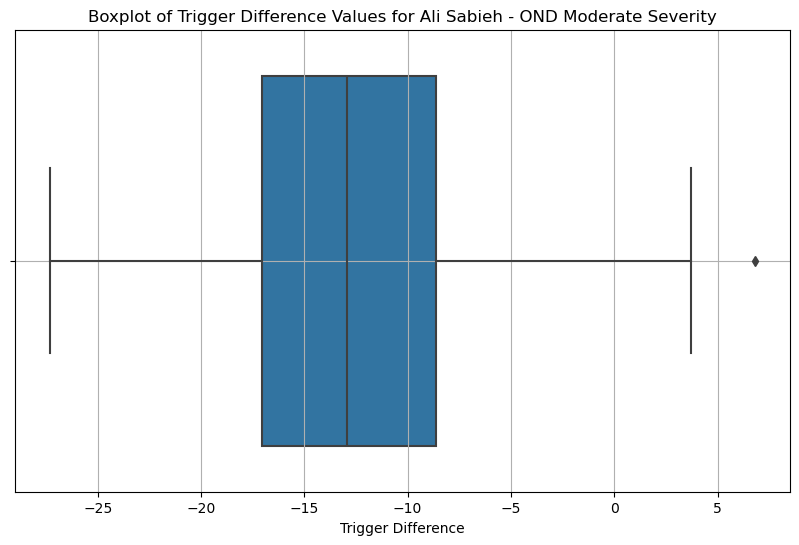

Quantile Ranges for Ali Sabieh:
{0.0: -27.30890082757208, 0.25: -17.031052009463423, 0.5: -12.958092740570681, 0.75: -8.62832283283949, 1.0: 6.79384391071433}




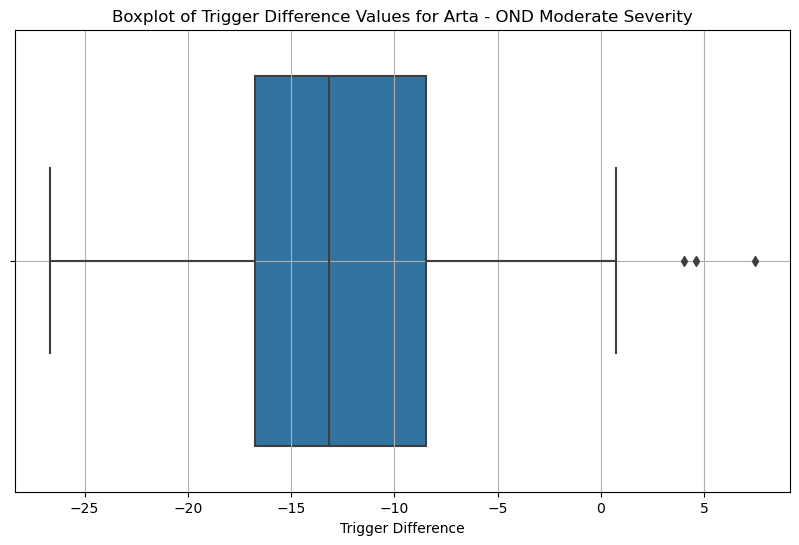

Quantile Ranges for Arta:
{0.0: -26.6692482688136, 0.25: -16.73258928533971, 0.5: -13.17828285117776, 0.75: -8.476081857963816, 1.0: 7.442568356223063}




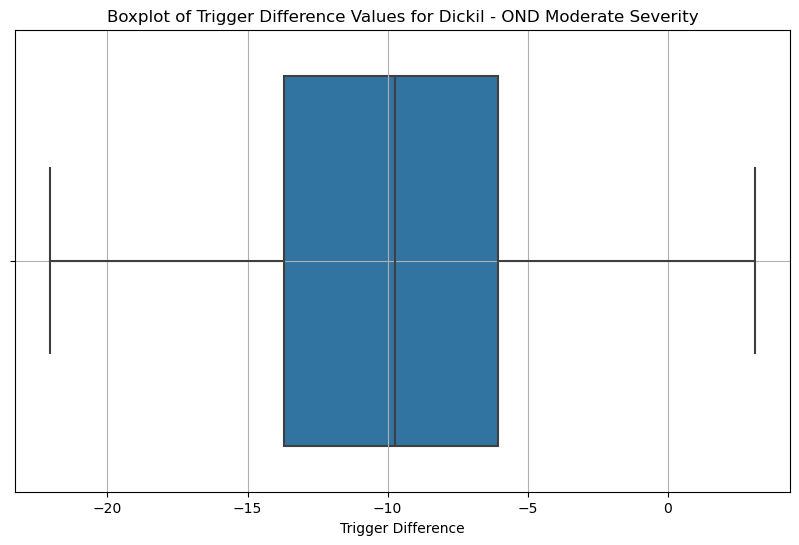

Quantile Ranges for Dickil:
{0.0: -22.048977896725912, 0.25: -13.687893477479504, 0.5: -9.74408813641726, 0.75: -6.073702547811196, 1.0: 3.1004151776923052}




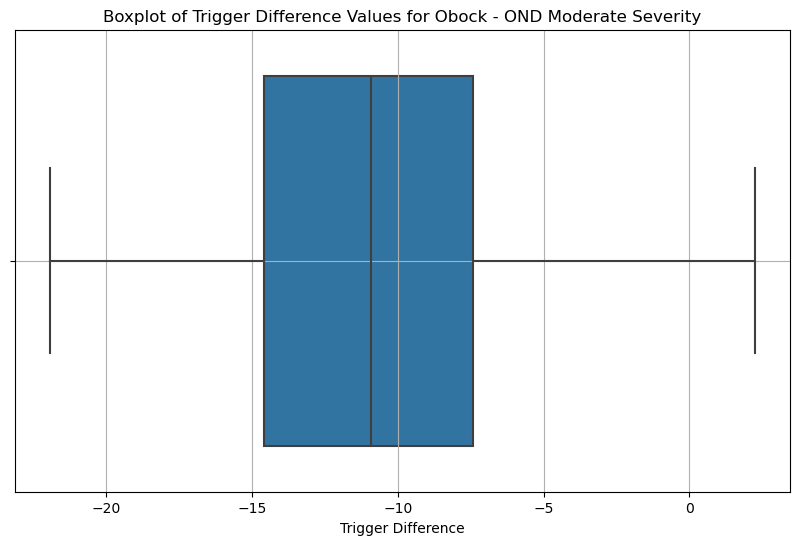

Quantile Ranges for Obock:
{0.0: -21.9338960590204, 0.25: -14.599974718563995, 0.5: -10.909955644630283, 0.75: -7.41977264112887, 1.0: 2.2416908555398933}




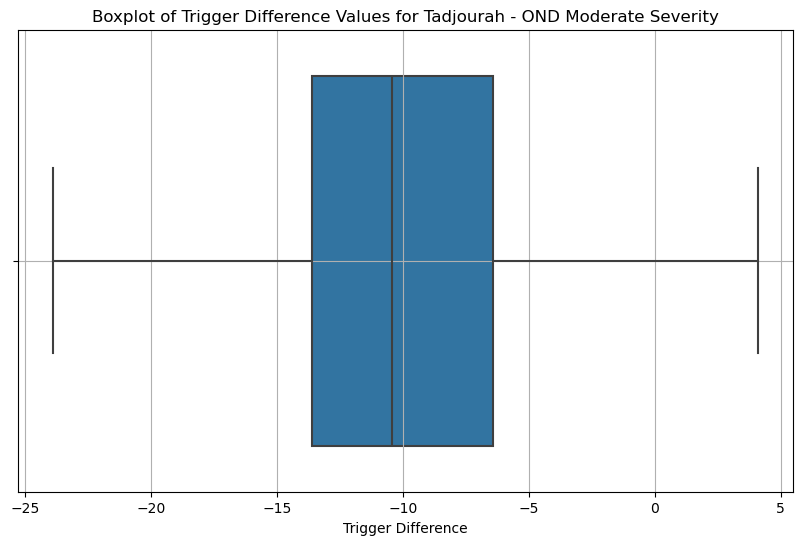

Quantile Ranges for Tadjourah:
{0.0: -23.86127559158392, 0.25: -13.584590836870344, 0.5: -10.413904054687361, 0.75: -6.4048880525043295, 1.0: 4.093783108107651}




In [70]:
u.plot_boxplots_and_quantiles_admin1(combined_admin1, season = 'OND', severity = 'Moderate Severity')